In [1]:
import sys

sys.path.remove('/people/enge625/.local/lib/python3.9/site-packages')
sys.path.append('/people/enge625/.local/lib/python3.9/site-packages')
sys.path.append('/people/enge625/src/easy_ntk/')

import numpy as np
import torch
import random

import matplotlib.pyplot as plt


import torch
from torch import nn, optim
from torch import load
from torch.nn import functional as F
from torch import autograd

from torchvision import datasets

from torch.utils.data import TensorDataset
from torch.utils.data import DataLoader

import time

import sys
from pathlib import Path

#from numba import njit

from tqdm import tqdm

import os

import gc

import torchntk.autograd as ezntk

import scipy.ndimage as ndimage

#from cleverhans.torch.attacks.fast_gradient_method import fast_gradient_method
#from cleverhans.torch.attacks.projected_gradient_descent import (
#    projected_gradient_descent,
#)
from scipy.stats import kendalltau

from utils2 import process_Cifar10
from einops import rearrange

import torch
import torch.nn as nn
import os

from scipy.stats import kendalltau, spearmanr
import matplotlib.gridspec as gridspec

In [2]:
train, test, combined = process_Cifar10('./')
SEED = 0

In [3]:

__all__ = [
    "ResNet",
    "resnet18",
    "resnet34",
    "resnet50",
]


def conv3x3(in_planes, out_planes, stride=1, groups=1, dilation=1):
    """3x3 convolution with padding"""
    return nn.Conv2d(
        in_planes,
        out_planes,
        kernel_size=3,
        stride=stride,
        padding=dilation,
        groups=groups,
        bias=False,
        dilation=dilation,
    )


def conv1x1(in_planes, out_planes, stride=1):
    """1x1 convolution"""
    return nn.Conv2d(in_planes, out_planes, kernel_size=1, stride=stride, bias=False)


class BasicBlock(nn.Module):
    expansion = 1

    def __init__(
        self,
        inplanes,
        planes,
        stride=1,
        downsample=None,
        groups=1,
        base_width=64,
        dilation=1,
        norm_layer=None,
    ):
        super(BasicBlock, self).__init__()
        if norm_layer is None:
            norm_layer = nn.BatchNorm2d
        if groups != 1 or base_width != 64:
            raise ValueError("BasicBlock only supports groups=1 and base_width=64")
        if dilation > 1:
            raise NotImplementedError("Dilation > 1 not supported in BasicBlock")
        # Both self.conv1 and self.downsample layers downsample the input when stride != 1
        self.conv1 = conv3x3(inplanes, planes, stride)
        self.bn1 = norm_layer(planes)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = conv3x3(planes, planes)
        self.bn2 = norm_layer(planes)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        identity = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)

        if self.downsample is not None:
            identity = self.downsample(x)

        out += identity
        out = self.relu(out)

        return out


class Bottleneck(nn.Module):
    expansion = 4

    def __init__(
        self,
        inplanes,
        planes,
        stride=1,
        downsample=None,
        groups=1,
        base_width=64,
        dilation=1,
        norm_layer=None,
    ):
        super(Bottleneck, self).__init__()
        if norm_layer is None:
            norm_layer = nn.BatchNorm2d
        width = int(planes * (base_width / 64.0)) * groups
        # Both self.conv2 and self.downsample layers downsample the input when stride != 1
        self.conv1 = conv1x1(inplanes, width)
        self.bn1 = norm_layer(width)
        self.conv2 = conv3x3(width, width, stride, groups, dilation)
        self.bn2 = norm_layer(width)
        self.conv3 = conv1x1(width, planes * self.expansion)
        self.bn3 = norm_layer(planes * self.expansion)
        self.relu = nn.ReLU(inplace=True)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        identity = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)

        out = self.conv3(out)
        out = self.bn3(out)

        if self.downsample is not None:
            identity = self.downsample(x)

        out += identity
        out = self.relu(out)

        return out


class ResNet(nn.Module):
    def __init__(
        self,
        block,
        layers,
        num_classes=10,
        zero_init_residual=False,
        groups=1,
        width_per_group=64,
        replace_stride_with_dilation=None,
        norm_layer=None,
    ):
        super(ResNet, self).__init__()
        if norm_layer is None:
            norm_layer = nn.BatchNorm2d
        self._norm_layer = norm_layer

        self.inplanes = 64
        self.dilation = 1
        if replace_stride_with_dilation is None:
            # each element in the tuple indicates if we should replace
            # the 2x2 stride with a dilated convolution instead
            replace_stride_with_dilation = [False, False, False]
        if len(replace_stride_with_dilation) != 3:
            raise ValueError(
                "replace_stride_with_dilation should be None "
                "or a 3-element tuple, got {}".format(replace_stride_with_dilation)
            )
        self.groups = groups
        self.base_width = width_per_group

        # CIFAR10: kernel_size 7 -> 3, stride 2 -> 1, padding 3->1
        self.conv1 = nn.Conv2d(
            3, self.inplanes, kernel_size=3, stride=1, padding=1, bias=False
        )
        # END

        self.bn1 = norm_layer(self.inplanes)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.layer1 = self._make_layer(block, 64, layers[0])
        self.layer2 = self._make_layer(
            block, 128, layers[1], stride=2, dilate=replace_stride_with_dilation[0]
        )
        self.layer3 = self._make_layer(
            block, 256, layers[2], stride=2, dilate=replace_stride_with_dilation[1]
        )
        self.layer4 = self._make_layer(
            block, 512, layers[3], stride=2, dilate=replace_stride_with_dilation[2]
        )
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(512 * block.expansion, num_classes)

        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode="fan_out", nonlinearity="relu")
            elif isinstance(m, (nn.BatchNorm2d, nn.GroupNorm)):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)

        # Zero-initialize the last BN in each residual branch,
        # so that the residual branch starts with zeros, and each residual block behaves like an identity.
        # This improves the model by 0.2~0.3% according to https://arxiv.org/abs/1706.02677
        if zero_init_residual:
            for m in self.modules():
                if isinstance(m, Bottleneck):
                    nn.init.constant_(m.bn3.weight, 0)
                elif isinstance(m, BasicBlock):
                    nn.init.constant_(m.bn2.weight, 0)

    def _make_layer(self, block, planes, blocks, stride=1, dilate=False):
        norm_layer = self._norm_layer
        downsample = None
        previous_dilation = self.dilation
        if dilate:
            self.dilation *= stride
            stride = 1
        if stride != 1 or self.inplanes != planes * block.expansion:
            downsample = nn.Sequential(
                conv1x1(self.inplanes, planes * block.expansion, stride),
                norm_layer(planes * block.expansion),
            )

        layers = []
        layers.append(
            block(
                self.inplanes,
                planes,
                stride,
                downsample,
                self.groups,
                self.base_width,
                previous_dilation,
                norm_layer,
            )
        )
        self.inplanes = planes * block.expansion
        for _ in range(1, blocks):
            layers.append(
                block(
                    self.inplanes,
                    planes,
                    groups=self.groups,
                    base_width=self.base_width,
                    dilation=self.dilation,
                    norm_layer=norm_layer,
                )
            )

        return nn.Sequential(*layers)

    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)

        x = self.avgpool(x)
        z = x.reshape(x.size(0), -1)
        x = self.fc(z)

        return x
    
    def forward_cam_conv1(self, x):
        y = self.conv1(x)
        x = self.bn1(y)
        x = self.relu(x)
        x = self.maxpool(x)

        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)

        x = self.avgpool(x)
        z = x.reshape(x.size(0), -1)
        x = self.fc(z)

        return x, y
    
    def forward_conv1(self, x):
        x = self.conv1(x)
        return x
    def forward_bn1(self,x):
        x = self.conv1(x)
        x = self.bn1(x)
        return x
    def forward_layer1(self,x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        x = self.layer1(x)
        return x
    def forward_layer2(self,x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        x = self.layer1(x)
        x = self.layer2(x)
        return x
    def forward_layer3(self,x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        return x
    def forward_layer4(self,x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        return x
    def forward_flat(self,x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)

        x = self.avgpool(x)
        x = x.reshape(x.size(0), -1)
        return x
        


def _resnet(arch, block, layers, pretrained, progress, device, **kwargs):
    model = ResNet(block, layers, **kwargs)
    if pretrained:
        script_dir = os.path.dirname(__file__)
        state_dict = torch.load(
            script_dir + "/state_dicts/" + arch + ".pt", map_location=device
        )
        model.load_state_dict(state_dict)
    return model


def resnet18(pretrained=False, progress=True, device="cpu", **kwargs):
    """Constructs a ResNet-18 model.
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
        progress (bool): If True, displays a progress bar of the download to stderr
    """
    return _resnet(
        "resnet18", BasicBlock, [2, 2, 2, 2], pretrained, progress, device, **kwargs
    )

def resnet34(pretrained=False, progress=True, device="cpu", **kwargs):
    """Constructs a ResNet-34 model.
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
        progress (bool): If True, displays a progress bar of the download to stderr
    """
    return _resnet(
        "resnet34", BasicBlock, [3, 4, 6, 3], pretrained, progress, device, **kwargs
    )


def resnet50(pretrained=False, progress=True, device="cpu", **kwargs):
    """Constructs a ResNet-50 model.
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
        progress (bool): If True, displays a progress bar of the download to stderr
    """
    return _resnet(
        "resnet50", Bottleneck, [3, 4, 6, 3], pretrained, progress, device, **kwargs
    )

In [4]:
class ConvBNReLU(nn.Sequential):
    def __init__(self, in_planes, out_planes, kernel_size=3, stride=1, groups=1):
        padding = (kernel_size - 1) // 2
        super(ConvBNReLU, self).__init__(
            nn.Conv2d(
                in_planes,
                out_planes,
                kernel_size,
                stride,
                padding,
                groups=groups,
                bias=False,
            ),
            nn.BatchNorm2d(out_planes),
            nn.ReLU6(inplace=True),
        )


class InvertedResidual(nn.Module):
    def __init__(self, inp, oup, stride, expand_ratio):
        super(InvertedResidual, self).__init__()
        self.stride = stride
        assert stride in [1, 2]

        hidden_dim = int(round(inp * expand_ratio))
        self.use_res_connect = self.stride == 1 and inp == oup

        layers = []
        if expand_ratio != 1:
            # pw
            layers.append(ConvBNReLU(inp, hidden_dim, kernel_size=1))
        layers.extend(
            [
                # dw
                ConvBNReLU(hidden_dim, hidden_dim, stride=stride, groups=hidden_dim),
                # pw-linear
                nn.Conv2d(hidden_dim, oup, 1, 1, 0, bias=False),
                nn.BatchNorm2d(oup),
            ]
        )
        self.conv = nn.Sequential(*layers)

    def forward(self, x):
        if self.use_res_connect:
            return x + self.conv(x)
        else:
            return self.conv(x)


class MobileNetV2(nn.Module):
    def __init__(self, num_classes=10, width_mult=1.0):
        super(MobileNetV2, self).__init__()
        block = InvertedResidual
        input_channel = 32
        last_channel = 1280

        # CIFAR10
        inverted_residual_setting = [
            # t, c, n, s
            [1, 16, 1, 1],
            [6, 24, 2, 1],  # Stride 2 -> 1 for CIFAR-10
            [6, 32, 3, 2],
            [6, 64, 4, 2],
            [6, 96, 3, 1],
            [6, 160, 3, 2],
            [6, 320, 1, 1],
        ]
        # END

        # building first layer
        input_channel = int(input_channel * width_mult)
        self.last_channel = int(last_channel * max(1.0, width_mult))

        # CIFAR10: stride 2 -> 1
        features = [ConvBNReLU(3, input_channel, stride=1)]
        # END

        # building inverted residual blocks
        for t, c, n, s in inverted_residual_setting:
            output_channel = int(c * width_mult)
            for i in range(n):
                stride = s if i == 0 else 1
                features.append(
                    block(input_channel, output_channel, stride, expand_ratio=t)
                )
                input_channel = output_channel
        # building last several layers
        features.append(ConvBNReLU(input_channel, self.last_channel, kernel_size=1))
        # make it nn.Sequential
        self.features = nn.Sequential(*features)

        # building classifier
        self.classifier = nn.Sequential(
            nn.Dropout(0.2),
            nn.Linear(self.last_channel, num_classes),
        )

        # weight initialization
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode="fan_out")
                if m.bias is not None:
                    nn.init.zeros_(m.bias)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.ones_(m.weight)
                nn.init.zeros_(m.bias)
            elif isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, 0, 0.01)
                nn.init.zeros_(m.bias)

    def forward(self, x):
        x = self.features(x)
        z = x.mean([2, 3])
        x = self.classifier(z)
        return x


def mobilenet_v2(pretrained=False, progress=True, device="cpu", **kwargs):
    """
    Constructs a MobileNetV2 architecture from
    `"MobileNetV2: Inverted Residuals and Linear Bottlenecks" <https://arxiv.org/abs/1801.04381>`_.
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
        progress (bool): If True, displays a progress bar of the download to stderr
    """
    model = MobileNetV2(**kwargs)
    if pretrained:
        script_dir = os.path.dirname(__file__)
        state_dict = torch.load(
            script_dir + "/state_dicts/mobilenet_v2.pt", map_location=device
        )
        model.load_state_dict(state_dict)
    return model

In [5]:
MODELNAME = 'ResNet18'

model = resnet18(device='cuda')
model.load_state_dict(torch.load('/rcfs/projects/task0_pmml/MODELS/resnet18.pt'))

model.cuda()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [6]:
train_data = datasets.CIFAR10(
    root = '/people/enge625/NOTEBOOKS/',
    train = True,                          
    download = False,            
)


test_data = datasets.CIFAR10(
    root = '/people/enge625/NOTEBOOKS/', 
    train = False, 
    download=False,
)

In [7]:
train_x = torch.tensor(train_data.data)
test_x = torch.tensor(test_data.data)

train_y = torch.tensor(train_data.targets)
test_y = torch.tensor(test_data.targets)

train_x_plot = torch.tensor(train_data.data).cpu().numpy()
test_x_plot = torch.tensor(test_data.data).cpu().numpy()

train_y_plot = torch.tensor(train_data.targets).cpu().numpy()
test_y_plot = torch.tensor(test_data.targets).cpu().numpy()

train_x = train_x/255
test_x = test_x/255

mean = torch.tensor([0.4914, 0.4822, 0.4465])
std = torch.tensor([0.2471, 0.2435, 0.2616])

test_x -= mean[None,None,None,:]
test_x /= std[None,None,None,:]

train_x -= mean[None,None,None,:]
train_x /= std[None,None,None,:]

train_y = train_y.float()
test_y = test_y.float()

train_x = train_x.to('cuda')
train_y = train_y.to('cuda')

test_x = test_x.to('cuda')
test_y = test_y.to('cuda')

train_x = rearrange(train_x,'b w h f -> b f w h')
test_x = rearrange(test_x,'b w h f -> b f w h')

In [8]:
torch.sum(torch.argmax(model(test_x),axis=1) == test_y)

tensor(9166, device='cuda:0')

In [9]:
all_x = torch.cat([test_x,train_x])
all_y = torch.cat([test_y,train_y])

In [10]:
from torch.utils.data import DataLoader
from torch.utils.data import TensorDataset

train_loader = DataLoader(train,batch_size=64,shuffle=False)
test_loader = DataLoader(test,batch_size=64,shuffle=False)
test_loader2 = DataLoader(test,batch_size=150,shuffle=False)
combined_loader = DataLoader(combined,batch_size=150,shuffle=False)

In [11]:
model = model.eval()
model.to('cuda')
correct=torch.tensor([0,],device='cuda')
train_predictions = []
with torch.no_grad():
    for i,data in enumerate(train_loader):
        x, y = data
        x = x.cuda()
        y = y.cuda()
        #out, z = model(x)
        out = model(x)
        classify = torch.argmax(torch.softmax(out,dim=1),dim=1)
        num = torch.sum(classify==y)
        correct+=num
        train_predictions.append(classify.cpu().numpy())     
print('NN Train acc: {:.2f}'.format((100*correct.cpu().numpy()/len(train_y))[0]))

train_predictions=np.concatenate(train_predictions)

NN Train acc: 99.87


In [12]:
model = model.eval()
correct=torch.tensor([0,],device='cuda')
predictions_model = []
confidences_model_right_class = []
confidences_model_guessed_class = []
confidences_all = []
NN_out = []
NN_logits = []
with torch.no_grad():
    for i,data in enumerate(test_loader):
        x, y = data
        x = x.cuda()
        y = y.cuda()
        out = model(x)
        NN_logits.append(out.cpu().numpy())
        classify = torch.argmax(torch.softmax(out,dim=1),dim=1)
        NN_out.append(torch.softmax(out,dim=1))
        for i in range(len(y)):
            confidences_model_right_class.append(torch.softmax(out,dim=1)[i][torch.tensor(y[i],dtype=torch.long)])
            confidences_model_guessed_class.append(torch.softmax(out,dim=1)[i][classify[i]])
        confidences_all.append(out)
        predictions_model.append(classify)
        num = torch.sum(classify==y)
        correct+=num
print('NN Test acc: {:.2f}'.format((100*correct.cpu().numpy()/len(test_y))[0]))
predictions_model = torch.cat(predictions_model)
confidences_model_right_class = torch.stack(confidences_model_right_class).cpu().numpy()
confidences_model_guessed_class = torch.stack(confidences_model_guessed_class).cpu().numpy()
confidences_all = torch.cat(confidences_all).cpu().numpy()
NN_out = torch.cat(NN_out).cpu().numpy()
test_predictions = np.argmax(NN_out,axis=1)

/tmp/ipykernel_228862/2822703574.py:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  confidences_model_right_class.append(torch.softmax(out,dim=1)[i][torch.tensor(y[i],dtype=torch.long)])


NN Test acc: 93.12


In [13]:
NN_test_acc = 93.12

In [14]:
NN_logits = np.concatenate(NN_logits)

In [15]:
# lossfn = torch.nn.CrossEntropyLoss()
# all_dL_dF = []
# for (x,y) in tqdm(combined_loader):
#     x = x.to('cuda')
#     y = torch.tensor(y.to('cuda'),dtype=torch.long)
#     for i in range(len(x)):
#         with torch.no_grad():
#             Yhat = model(x[i:i+1])
#         Yhat = torch.tensor(Yhat,requires_grad=True)
#         loss = lossfn(Yhat,target=y[i:i+1])
#         loss.backward()
#         all_dL_dF.append(Yhat.grad.detach().clone().to('cpu'))
        
    
# all_dL_dF = torch.cat(all_dL_dF).cpu().numpy()

# TraceIn = 0
# for i in tqdm(range(10)):
#     NTK = np.load(f'/rcfs/projects/task0_pmml/large_model_NTKs/resnet18/NTK_summed_unnormalized/NTK_summed_{i}.npy')
#     TraceIn += all_dL_dF[:,i][None,:] * NTK * all_dL_dF[:,i][:,None]

#np.save('/rcfs/projects/task0_pmml/large_model_NTKs/resnet18/TraceIn.npy',TraceIn)

# Calculate FULL Em Kernel

### Uncomment to see what modules I used

In [16]:
ALL_NAMES = []
for name,module in model.named_modules():
    print(name)
    
    if 'relu' in name:
        continue
    if '' == name:
        continue
        
    ALL_NAMES.append(name)
    


conv1
bn1
relu
maxpool
layer1
layer1.0
layer1.0.conv1
layer1.0.bn1
layer1.0.relu
layer1.0.conv2
layer1.0.bn2
layer1.1
layer1.1.conv1
layer1.1.bn1
layer1.1.relu
layer1.1.conv2
layer1.1.bn2
layer2
layer2.0
layer2.0.conv1
layer2.0.bn1
layer2.0.relu
layer2.0.conv2
layer2.0.bn2
layer2.0.downsample
layer2.0.downsample.0
layer2.0.downsample.1
layer2.1
layer2.1.conv1
layer2.1.bn1
layer2.1.relu
layer2.1.conv2
layer2.1.bn2
layer3
layer3.0
layer3.0.conv1
layer3.0.bn1
layer3.0.relu
layer3.0.conv2
layer3.0.bn2
layer3.0.downsample
layer3.0.downsample.0
layer3.0.downsample.1
layer3.1
layer3.1.conv1
layer3.1.bn1
layer3.1.relu
layer3.1.conv2
layer3.1.bn2
layer4
layer4.0
layer4.0.conv1
layer4.0.bn1
layer4.0.relu
layer4.0.conv2
layer4.0.bn2
layer4.0.downsample
layer4.0.downsample.0
layer4.0.downsample.1
layer4.1
layer4.1.conv1
layer4.1.bn1
layer4.1.relu
layer4.1.conv2
layer4.1.bn2
avgpool
fc


In [17]:
for name in ALL_NAMES:
    print(name)

conv1
bn1
maxpool
layer1
layer1.0
layer1.0.conv1
layer1.0.bn1
layer1.0.conv2
layer1.0.bn2
layer1.1
layer1.1.conv1
layer1.1.bn1
layer1.1.conv2
layer1.1.bn2
layer2
layer2.0
layer2.0.conv1
layer2.0.bn1
layer2.0.conv2
layer2.0.bn2
layer2.0.downsample
layer2.0.downsample.0
layer2.0.downsample.1
layer2.1
layer2.1.conv1
layer2.1.bn1
layer2.1.conv2
layer2.1.bn2
layer3
layer3.0
layer3.0.conv1
layer3.0.bn1
layer3.0.conv2
layer3.0.bn2
layer3.0.downsample
layer3.0.downsample.0
layer3.0.downsample.1
layer3.1
layer3.1.conv1
layer3.1.bn1
layer3.1.conv2
layer3.1.bn2
layer4
layer4.0
layer4.0.conv1
layer4.0.bn1
layer4.0.conv2
layer4.0.bn2
layer4.0.downsample
layer4.0.downsample.0
layer4.0.downsample.1
layer4.1
layer4.1.conv1
layer4.1.bn1
layer4.1.conv2
layer4.1.bn2
avgpool
fc


In [18]:
#model.hooks = {}

In [19]:
# activation = {}
# def get_activation(name):
#     def hook(model, input, output):
#         activation[name] = output.detach()
#     return hook


# NAME = 'fc'


In [20]:
#print(len(ALL_NAMES))

In [21]:
# for k,NAME in enumerate(ALL_NAMES):
#     EM_Component = torch.zeros((60_000,60_000),device='cpu')
    
#     for name, module in model.named_modules():
#         if name == NAME:
#             model.hooks[name] = module.register_forward_hook(get_activation(name))
   
#     with torch.no_grad():
#         for i in tqdm(range(6)):
#             activation = {}
#             X1 =  model.forward(all_x[i*10_000:(i+1)*10_000,])
#             X1_activation = activation[NAME].reshape(10_000,-1)
#             for j in range(6):
#                 activation = {}
#                 X2 =  model.forward(all_x[j*10_000:(j+1)*10_000,])
#                 X2_activation = activation[NAME].reshape(10_000,-1)
                
#                 component = torch.matmul(X1_activation,X2_activation.T).cpu()
#                 EM_Component[i*10_000:(i+1)*10_000,j*10_000:(j+1)*10_000] = component
    
#     torch.save(EM_Component,f'/rcfs/projects/task0_pmml/large_model_NTKs/resnet18/Embedding/{NAME}-{k}.pt')
#     model.hooks[NAME].remove()

In [22]:
# Em = 0
# for file in os.listdir('/rcfs/projects/task0_pmml/large_model_NTKs/resnet18/Embedding/'):
#     Em+=torch.load('/rcfs/projects/task0_pmml/large_model_NTKs/resnet18/Embedding/'+file)


In [23]:
#torch.save(Em,'/rcfs/projects/task0_pmml/large_model_NTKs/resnet18/Embedding.pt')

In [24]:
def center_kernel(K, copy=True):
    '''
    Centered version of a kernel matrix (corresponding to centering the)
    implicit feature map.
    '''
    means = K.mean(axis=0)
    if copy:
        K = K - means[None, :]
    else:
        K -= means[None, :]
    K -= means[:, None]
    K += means.mean()
    return K

# Load NTKs

In [25]:
modelname = 'resnet18'

### My pNTK

In [26]:
NTK = torch.load('/rcfs/projects/task0_pmml/large_model_NTKs/resnet18/fullNTK.pt',map_location='cpu')

index_test = len(test_x)
COS_SIM=True

K0 = NTK[index_test::,index_test::].cpu().numpy()
K1 = NTK[0:index_test,index_test::].cpu().numpy()
K2 = NTK[0:index_test,0:index_test].cpu().numpy()

K1 = K1 / (np.sqrt(np.diagonal(K0))[None,:]) / (np.sqrt(np.diagonal(K2))[:,None])
K0 = K0 / np.sqrt(np.diagonal(K0))[:,None] / np.sqrt(np.diagonal(K0))[None,:]

### my Centered, then normalized pNTK

In [27]:
# NTK_center = torch.load('/rcfs/projects/task0_pmml/large_model_NTKs/resnet18/fullNTK.pt',map_location='cpu')

# index_test = len(test_x)
# COS_SIM=True

# NTK_center = center_kernel(NTK_center)

# K0_center = NTK_center[index_test::,index_test::].cpu().numpy()
# K1_center = NTK_center[0:index_test,index_test::].cpu().numpy()
# K2_center = NTK_center[0:index_test,0:index_test].cpu().numpy()

# K1_center = K1_center / (np.sqrt(np.diagonal(K0_center))[None,:]) / (np.sqrt(np.diagonal(K2_center))[:,None])
# K0_center = K0_center / np.sqrt(np.diagonal(K0_center))[:,None] / np.sqrt(np.diagonal(K0_center))[None,:]

### pNTK0

In [28]:
NTK_0 = np.load('/rcfs/projects/task0_pmml/large_model_NTKs/resnet18/NTK_layerwise_sumall_unnormalized_np/NTK.npy')

index_test = 10_000

K0_0 = NTK_0[index_test::,index_test::]
K1_0 = NTK_0[0:index_test,index_test::]
K2_0 = NTK_0[0:index_test,0:index_test]

### CK

In [29]:
modelname = 'resnet18'
CK = torch.load(f'/rcfs/projects/task0_pmml/large_model_NTKs/{modelname}/fullCK.pt',map_location='cpu').cpu().numpy()

index_test = 10_000
K0_CK = CK[index_test::,index_test::]
K1_CK = CK[0:index_test,index_test::]
K2_CK = CK[0:index_test,0:index_test]

K1_CK = K1_CK / (np.sqrt(np.diagonal(K0_CK))[None,:]) / (np.sqrt(np.diagonal(K2_CK))[:,None])
K0_CK = K0_CK / np.sqrt(np.diagonal(K0_CK))[:,None] / np.sqrt(np.diagonal(K0_CK))[None,:]

### Embedding Kernel

In [30]:
NTK_Em = torch.load('/rcfs/projects/task0_pmml/large_model_NTKs/resnet18/Embedding.pt',map_location='cpu').cpu().numpy()
#else:
#NTK_Em = torch.load(f'/rcfs/projects/task0_pmml/DATA/EmbeddingsResNet18_{k}.pt').cpu().numpy()

index_test = 10_000
K0_Em = NTK_Em[index_test::,index_test::]
K1_Em = NTK_Em[0:index_test,index_test::]
K2_Em = NTK_Em[0:index_test,0:index_test]

K1_Em = K1_Em / (np.sqrt(np.diagonal(K0_Em))[None,:]) / (np.sqrt(np.diagonal(K2_Em))[:,None])
K0_Em = K0_Em / np.sqrt(np.diagonal(K0_Em))[:,None] / np.sqrt(np.diagonal(K0_Em))[None,:]

## TraceIn

In [31]:
NTK_TraceIn = np.load('/rcfs/projects/task0_pmml/large_model_NTKs/resnet18/TraceIn.npy')

index_test = 10_000
K0_TraceIn = NTK_TraceIn[index_test::,index_test::]
K1_TraceIn = NTK_TraceIn[0:index_test,index_test::]
K2_TraceIn = NTK_TraceIn[0:index_test,0:index_test]

K1_TraceIn = K1_TraceIn / (np.sqrt(np.diagonal(K0_TraceIn))[None,:]) / (np.sqrt(np.diagonal(K2_TraceIn))[:,None])
K0_TraceIn = K0_TraceIn / np.sqrt(np.diagonal(K0_TraceIn))[:,None] / np.sqrt(np.diagonal(K0_TraceIn))[None,:]

# proj-pNTK

took 40 minutes to compute a100-80 with 512 * 20 features

In [32]:
NTK_projpNTK = torch.from_numpy(np.load('/rcfs/projects/task0_pmml/proj_trNTK/resnet18_pNTK/0/grads.mmap')).cuda()

NTK_projpNTK = torch.matmul(NTK_projpNTK,NTK_projpNTK.T).detach().cpu().numpy()



K0_projpNTK = NTK_projpNTK[index_test::,index_test::]
K1_projpNTK = NTK_projpNTK[0:index_test,index_test::]
K2_projpNTK = NTK_projpNTK[0:index_test,0:index_test]

K1_projpNTK = K1_projpNTK / (np.sqrt(np.diagonal(K0_projpNTK))[None,:]) / (np.sqrt(np.diagonal(K2_projpNTK))[:,None])
K0_projpNTK = K0_projpNTK / np.sqrt(np.diagonal(K0_projpNTK))[:,None] / np.sqrt(np.diagonal(K0_projpNTK))[None,:]

# projected-trNTK

### projected-trNTK took 7 hours to compute. (1.5 hours with 2048 feature dimension, but that maybe too small?)

### projected-trNTK took 6.5 hours to compute (cuda broken, used standard projecector) for dim=10_000

In [33]:
import torch
import numpy as np
NTK_proj = 0
for c in tqdm(range(10)):
    A = torch.from_numpy(np.load(f'/rcfs/projects/task0_pmml/proj_trNTK/resnet18_trNTK/largegrads_{c}.npy')).to('cuda')
    NTK_proj += torch.matmul(A,A.T).cpu().numpy()

100%|███████████████████████████████████████████████████████████████████████████████████| 10/10 [02:36<00:00, 15.67s/it]


In [34]:
index_test = 10_000
K0_proj = NTK_proj[index_test::,index_test::]
K1_proj = NTK_proj[0:index_test,index_test::]
K2_proj = NTK_proj[0:index_test,0:index_test]

K1_proj = K1_proj / (np.sqrt(np.diagonal(K0_proj))[None,:]) / (np.sqrt(np.diagonal(K2_proj))[:,None])
K0_proj = K0_proj / np.sqrt(np.diagonal(K0_proj))[:,None] / np.sqrt(np.diagonal(K0_proj))[None,:]

# Residual between proj-trNTK and trNTK

In [35]:
# eps = np.linspace(0,1,1000)
# k = 2048
# plt.plot(eps,(1-2*np.exp(-(k*eps**2)/8))**2)
# Prob = []
# for epsilon in eps:
#     Prob_ = np.logical_and((K1.flatten()-epsilon)/(1+epsilon) < K1_proj.flatten(),(K1.flatten()+epsilon)/(1-epsilon) > K1_proj.flatten()).sum() / len(K1_proj.flatten())
#     Prob.append(Prob_)
# plt.plot(eps,Prob)

#This doesn't make much sense; why would be the probability be 1 for eps=> 0? insanity.

In [36]:
residuals = (K1-K1_proj).flatten()

# Empirically, seems to me like the probability is more like:

#  $$P(|\cos(\theta(\vec{u},\vec{v})) - \cos(\Theta(P\vec{u},P\vec{v}))| < \epsilon) ~ e^{(-\epsilon \cdot \alpha)}$$

# Where $\alpha$ has some dependence on k

In [37]:
np.logspace?

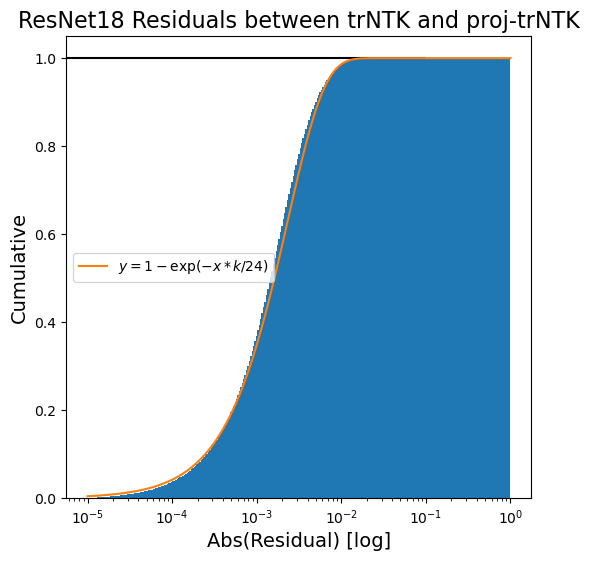

In [38]:
fig = plt.figure(figsize=(6,6))
plt.hist(np.abs(residuals),bins=np.logspace(-5,0,300),cumulative=True,density=True,)
#plt.yscale('log')
plt.title('ResNet18 Residuals between trNTK and proj-trNTK',fontsize=16)
plt.ylabel('Cumulative',fontsize=14)
plt.xlabel('Abs(Residual) [log]',fontsize=14)

k=10_240
x = np.logspace(-5,0,1000)
k=10_240
y = 1 - np.exp(-x*k/24)
plt.hlines(1.0,0.0,0.1,color='k')
plt.xscale('log')
#plt.xlim(0,1)
plt.plot(x,y,label=r'$y = 1 - \exp(-x*k/24)$')
plt.legend(loc='center left')
plt.savefig('/rcfs/projects/task0_pmml/images/resnet18_residuals.png')
plt.show()
#This is exponential, because the histogram looks like a line on both sides logarithmically scaled.

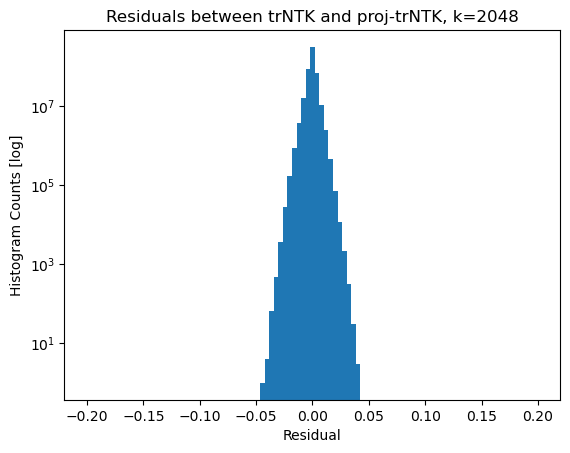

In [39]:
plt.hist((K1-K1_proj).flatten(),bins=np.linspace(-0.2,0.2,100),)
plt.yscale('log')
plt.title('Residuals between trNTK and proj-trNTK, k=2048')
plt.ylabel('Histogram Counts [log]')
plt.xlabel('Residual')
plt.show()

# Compute GLMs

In [40]:
from scipy.optimize import minimize
from scipy.special import erf
from scipy.stats import norm
from math import log
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier
from sklearn.metrics import r2_score

from joblib import dump, load

In [41]:
train_labels_regression = train_y.cpu().numpy()
validation_labels = test_y.cpu().numpy()

In [42]:
LogKernelRegression_pNTK = SGDClassifier(loss='log_loss',penalty='l2',alpha=1e-4,fit_intercept=True,class_weight="balanced")
LogKernelRegression_pNTK0 = SGDClassifier(loss='log_loss',penalty='l2',alpha=1e-4,fit_intercept=True,class_weight="balanced")
LogKernelRegression_CK = SGDClassifier(loss='log_loss',penalty='l2',alpha=1e-4,fit_intercept=True,class_weight="balanced")
LogKernelRegression_Em = SGDClassifier(loss='log_loss',penalty='l2',alpha=1e-4,fit_intercept=True,class_weight="balanced")
LogKernelRegression_TraceIn = SGDClassifier(loss='log_loss',penalty='l2',alpha=1e-4,fit_intercept=True,class_weight="balanced")

LogKernelRegression_proj = SGDClassifier(loss='log_loss',penalty='l2',alpha=1e-3,fit_intercept=True,class_weight="balanced")
LogKernelRegression_projpNTK = SGDClassifier(loss='log_loss',penalty='l2',alpha=1e-3,fit_intercept=True,class_weight="balanced")


In [43]:
svm_trNTK = SVC(kernel='precomputed', probability=True, decision_function_shape = "ovr")

In [44]:
LogKernelRegression_pNTK = load('/rcfs/projects/task0_pmml/large_model_NTKs/resnet18/GLMs/pNTK.joblib')
K1_weights = LogKernelRegression_pNTK.coef_
K1_intercept = LogKernelRegression_pNTK.intercept_

/people/enge625/.conda/envs/torch2_withtrak/lib/python3.9/site-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator SGDClassifier from version 1.1.1 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [45]:
LogKernelRegression_Em = load('/rcfs/projects/task0_pmml/large_model_NTKs/resnet18/GLMs/Em.joblib')
K1_Emweights = LogKernelRegression_Em.coef_
K1_Emintercept = LogKernelRegression_Em.intercept_

In [46]:
LogKernelRegression_pNTK0 = load('/rcfs/projects/task0_pmml/large_model_NTKs/resnet18/GLMs/pNTK0.joblib')
K1_0weights = LogKernelRegression_pNTK0.coef_
K1_0intercept = LogKernelRegression_pNTK0.intercept_

In [47]:
LogKernelRegression_CK = load('/rcfs/projects/task0_pmml/large_model_NTKs/resnet18/GLMs/CK.joblib')
K1_CKweights = LogKernelRegression_CK.coef_
K1_CKintercept = LogKernelRegression_CK.intercept_

In [48]:
LogKernelRegression_TraceIn = load('/rcfs/projects/task0_pmml/large_model_NTKs/resnet18/GLMs/TraceIn.joblib')
K1_TraceInweights = LogKernelRegression_TraceIn.coef_
K1_TraceInintercept = LogKernelRegression_TraceIn.intercept_

In [49]:
LogKernelRegression_proj = load('/rcfs/projects/task0_pmml/large_model_NTKs/resnet18/GLMs/proj.joblib')
K1_projweights = LogKernelRegression_proj.coef_
K1_projintercept = LogKernelRegression_proj.intercept_

In [50]:
LogKernelRegression_projpNTK = load('/rcfs/projects/task0_pmml/large_model_NTKs/resnet18/GLMs/projpNTK.joblib')
K1_projpNTKweights = LogKernelRegression_projpNTK.coef_
K1_projpNTKintercept = LogKernelRegression_projpNTK.intercept_

# Define Analysis Code

In [51]:
def fit_and_scale(LogKernelRegression,K0,K1,validation_labels):
    LogKernelRegression.fit(K0,train_labels_regression)
    weights = LogKernelRegression.coef_
    intercept = LogKernelRegression.intercept_
    y = LogKernelRegression.predict_proba(K1)
    print((LogKernelRegression.predict(K1)==validation_labels.cpu().numpy()[0:len(y)]).sum()/len(y))
    return weights, intercept, y, LogKernelRegression

In [52]:
from scipy.optimize import minimize
from scipy.special import erf
from scipy.stats import norm
from math import log
from sklearn.metrics import r2_score

def numpy_softmax(x):
    return np.exp(x) / np.sum(np.exp(x),axis=1)[:,None]

def sigmoid(p):
    return 1/(1+np.exp(-p))

def logit(p,eps=0.0):
    return np.log((p+eps)/(1-p+eps))

def softmax_numpy(x):
    return np.exp(x) / np.sum(np.exp(x))



In [53]:
MODELNAME = 'ResNet18'

In [54]:
from joblib import dump, load

# Break this down step by step

In [55]:
NN_predictions = np.argmax(confidences_all,axis=1)

In [56]:
def tau_comparison_final(X,Y):    
    
    correct_logit_mask = test_y.cpu().numpy().astype(int)
    
    
    X = np.array([softmax_numpy(X[i])[correct_logit_mask[i]] for i in range(len(X))])
    Y = np.array([softmax_numpy(Y[i])[correct_logit_mask[i]] for i in range(len(Y))])    

    
    mask = np.logical_or(np.logical_or(X==1,Y==1),np.logical_or(X==0,Y==0))
    X = X[~mask]
    Y = Y[~mask]
    
    plt.plot(X,Y,'.')
    #plt.xscale('log')
    #plt.yscale('log')
    
    Tau = kendalltau(X,Y).correlation
    return Tau

# SVM

In [57]:
svm_trNTK.fit(K0,train_labels_regression)
svm_predictions = svm_trNTK.predict(K1)

In [58]:
svm_log_prob = svm_trNTK.predict_log_proba(K1)

In [59]:
svm_probs_correct_logit = []
NN_probs_correct_logit = []
for i in range(len(validation_labels)):
    svm_probs_correct_logit.append(svm_log_prob[i,int(validation_labels[i])])
    NN_probs_correct_logit.append(confidences_all[i,int(validation_labels[i])])

In [60]:
kendalltau(svm_probs_correct_logit,NN_probs_correct_logit).correlation

0.46360659483654476

In [61]:
(svm_predictions == NN_predictions).sum() / len(NN_predictions)

0.9771

In [62]:
(svm_predictions ==validation_labels).sum() / len(NN_predictions) - (NN_predictions ==validation_labels).sum() / len(NN_predictions) 

-0.0010000000000000009

# pNTK

In [63]:
#K1_weights, K1_intercept, y_logisticregression, LogKernelRegression_pNTK = fit_and_scale(LogKernelRegression_pNTK,K0,K1,test_y)
K1_scaled = (K1 @ K1_weights.T) + K1_intercept
# test acc: 0.9277

In [64]:
(np.argmax(K1_scaled,axis=-1) == NN_predictions).sum() / len(NN_predictions)

0.9805

In [65]:
0.9277 - (NN_predictions ==validation_labels).sum() / len(NN_predictions) 

-0.0035000000000000586

0.7776529501631279

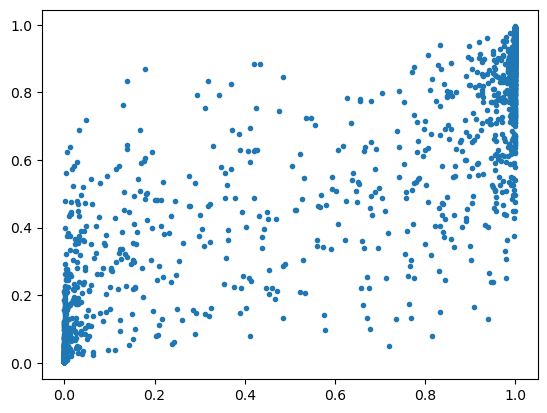

In [66]:
tau_comparison_final(K1_scaled,confidences_all)
#0.7755961255438976-- weird thing that this is better. weird thing to have stumbled upon.

# pNTK0

In [67]:
#K1_0weights, K1_0intercept, y_0logisticregression, LogKernelRegression_pNTK0 = fit_and_scale(LogKernelRegression_pNTK0,K0_0/K0_0.std(),K1_0/K0_0.std(),test_y)
K1_0scaled = (K1_0/K0_0.std() @ K1_0weights.T) + K1_0intercept
#test acc = 0.9225

0.6582548102593436

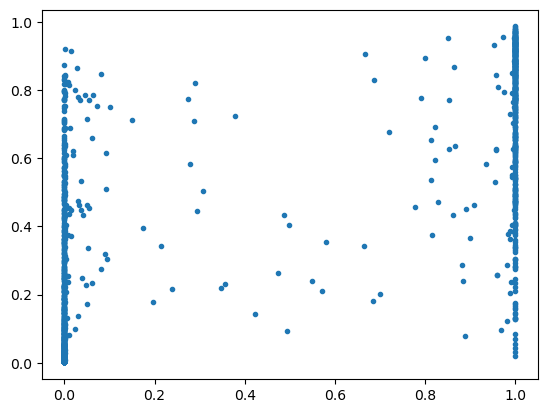

In [68]:
tau_comparison_final(K1_0scaled,confidences_all)
#0.6623560116203561

# Em Kernel

In [69]:
#K1_Emweights, K1_Emintercept, y_Emlogisticregression, LogKernelRegression_Em = fit_and_scale(LogKernelRegression_Em,K0_Em,K1_Em,test_y)
#dump(LogKernelRegression_Em,'/rcfs/projects/task0_pmml/large_model_NTKs/resnet18/GLMs/Em.joblib')
K1_Emscaled = (K1_Em @ K1_Emweights.T) + K1_Emintercept
#0.9287

0.7683351345093067

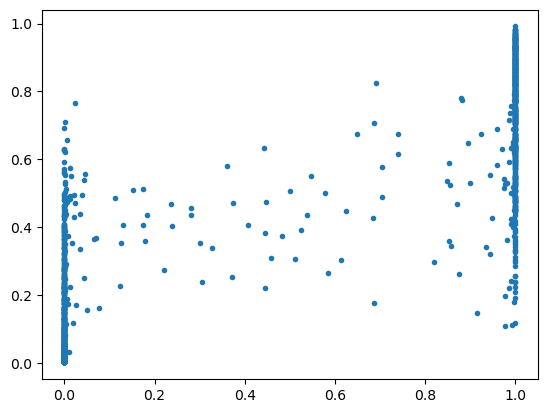

In [70]:
tau_comparison_final(K1_Emscaled,confidences_all)
#0.7633

# CK

In [71]:
#K1_CKweights, K1_CKintercept, y_CKlogisticregression, LogKernelRegression_CK = fit_and_scale(LogKernelRegression_CK,K0_CK,K1_CK,test_y)
#dump(LogKernelRegression_CK,'/rcfs/projects/task0_pmml/large_model_NTKs/resnet18/GLMs/CK.joblib')
K1_CKscaled = (K1_CK @ K1_CKweights.T) + K1_CKintercept
#0.9275

0.6303833152506605

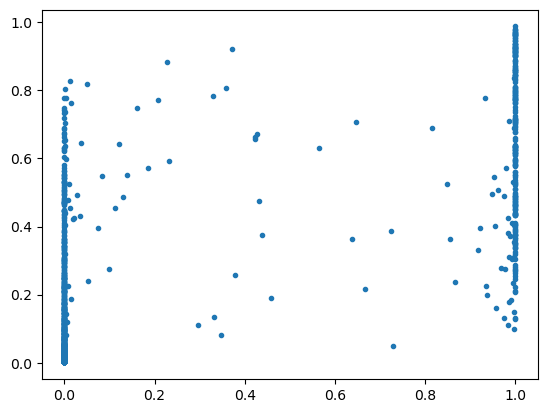

In [72]:
tau_comparison_final(K1_CKscaled,confidences_all)
#0.6316334556874491

# TraceIn

In [73]:
#K1_TraceInweights, K1_TraceInintercept, y_TraceInlogisticregression, LogKernelRegression_TraceIn = fit_and_scale(LogKernelRegression_TraceIn,K0_TraceIn,K1_TraceIn,test_y)
K1_TraceInscaled = (K1_TraceIn @ K1_TraceInweights.T) + K1_TraceInintercept
#0.9965

In [74]:
#dump(LogKernelRegression_TraceIn,'/rcfs/projects/task0_pmml/large_model_NTKs/resnet18/GLMs/TraceIn.joblib')

0.31879728583069855

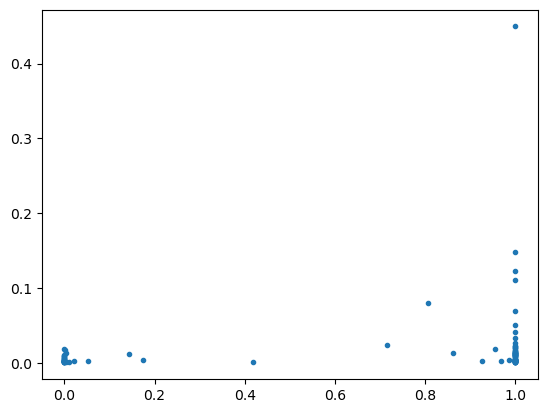

In [75]:
tau_comparison_final(K1_TraceInscaled,confidences_all)
#TraceIn 0.31879728583069855

# proj-pNTK

In [76]:
#K1_projpNTKweights, K1_projpNTKintercept, y_projpNTKlogisticregression, LogKernelRegression_projpNTK = fit_and_scale(LogKernelRegression_projpNTK,K0_projpNTK,K1_projpNTK,test_y)
K1_projpNTKscaled = (K1_projpNTK @ K1_projpNTKweights.T) + K1_projpNTKintercept
#0.9282

In [77]:
NN_test_acc/100 - 0.9282

0.0030000000000000027

In [78]:
#dump(LogKernelRegression_projpNTK,'/rcfs/projects/task0_pmml/large_model_NTKs/resnet18/GLMs/projpNTK.joblib')

0.4070778744792821

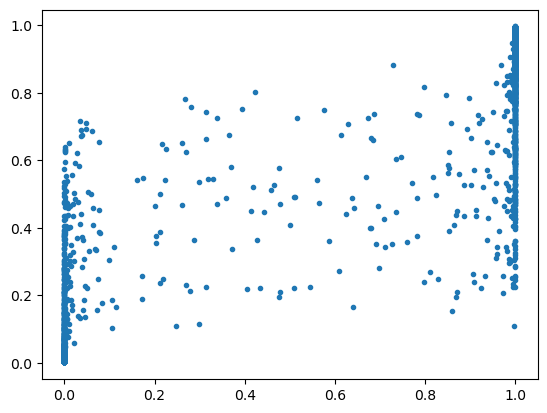

In [79]:
tau_comparison_final(K1_projpNTKscaled,confidences_all)
#0.52432
#0.40710739655213973
#seems pretty conveniant. maybe need to look into this.

# proj-trNTK

In [80]:
#K1_projweights, K1_projintercept, y_projlogisticregression, LogKernelRegression_proj = fit_and_scale(LogKernelRegression_proj,K0_proj,K1_proj,test_y)
K1_projscaled = (K1_proj @ K1_projweights.T) + K1_projintercept
#0.9291

In [81]:
NN_test_acc/100 - 0.9291

0.0020999999999999908

In [82]:
#dump(LogKernelRegression_proj,'/rcfs/projects/task0_pmml/large_model_NTKs/resnet18/GLMs/proj.joblib')

0.7371794766914096

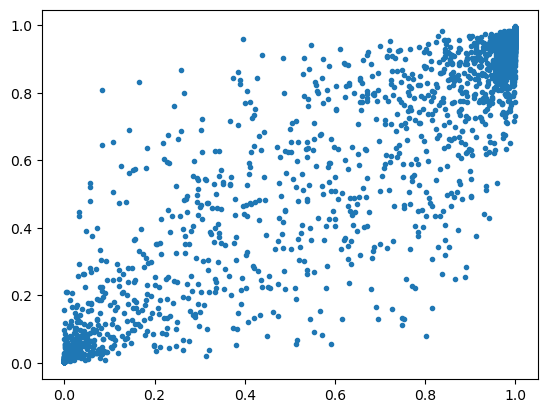

In [83]:
tau_comparison_final(K1_projscaled,confidences_all)

#proj pNTK
#0.6617931001691838-- half precision
#0.6595048143449895-- full precision
#############

#proj trNTK 
#0.720680478955444 -- 2048, full precision
#0.737 -- 10,000 full precision
#############

# Generate Attribution Examples Distribution 

In [84]:
cifar_labels = {}
cifar_labels[0] = 'plane'
cifar_labels[1] = 'car'
cifar_labels[2] = 'bird'
cifar_labels[3] = 'cat'
cifar_labels[4] = 'deer'
cifar_labels[5] = 'dog'
cifar_labels[6] = 'frog'
cifar_labels[7] = 'horse'
cifar_labels[8] = 'ship'
cifar_labels[9] = 'truck'

cifar_labels_list = [cifar_labels[i] for i in range(10)]
colors = ['tab:blue','tab:orange','tab:green','tab:red','tab:purple','c','xkcd:brown','xkcd:electric blue','m','xkcd:mustard',]


In [85]:
import matplotlib.patches as mpatches

In [86]:
def exactly_as_they_do_it(logit):
    prob = 1/(1+np.exp(-1*logit))
    return prob / np.sum(prob,axis=1)

In [87]:
pNTK_predictions = LogKernelRegression_pNTK.predict(K1)

In [88]:
pNTK_predictions = LogKernelRegression_pNTK.predict(K1)
pNTK0_predictions = LogKernelRegression_pNTK0.predict(K1_0/K0_0.std())
Em_predictions = LogKernelRegression_Em.predict(K1_Em)
CK_predictions = LogKernelRegression_CK.predict(K1_CK)
TraceIn_predictions = LogKernelRegression_TraceIn.predict(K1_TraceIn)
proj_predictions = LogKernelRegression_proj.predict(K1_proj)
projpNTK_predictions = LogKernelRegression_projpNTK.predict(K1_projpNTK)

# Investigate ONE Attribution Visualization

In [89]:
indices_wrong = np.where(test_y_plot != test_predictions)[0]
for i in range(10):
    print(cifar_labels[i],'{:.3f}'.format((test_predictions[indices_wrong]==i).sum()/len(indices_wrong)))
    

plane 0.109
car 0.042
bird 0.128
cat 0.205
deer 0.092
dog 0.174
frog 0.055
horse 0.045
ship 0.077
truck 0.073


In [90]:
def OneVizDis(test_index,kernel_name: str,FLAG=False,HOTFIX=True):
    NAMES = np.array(['trNTK','trNTK0','proj-trNTK','proj-pNTK','Em','CK'])
    if not(kernel_name in NAMES):
        raise ValueError(f'kernel_name must be one of {NAMES}')
    
   
    Kernels = [K1,K1_0,K1_proj,K1_projpNTK,K1_Em,K1_CK]
    Weights = [K1_weights, K1_0weights, K1_projweights, K1_projpNTKweights, K1_Emweights, K1_CKweights]
    Intercepts = [K1_intercept, K1_0intercept, K1_projintercept, K1_projpNTKintercept, K1_Emintercept, K1_CKintercept]
    Predictions = [pNTK_predictions, pNTK0_predictions, proj_predictions, projpNTK_predictions, Em_predictions, CK_predictions]
#     Kernels = [K1,]
#     Weights = [K1_weights,]
#     Intercepts = [K1_intercept,]
#     Predictions = [pNTK_predictions,]
    
    
    plt.rcParams['text.usetex'] = False
    fig = plt.figure(figsize=(8,5))
    outer = gridspec.GridSpec(1, 3, wspace=0.4, hspace=0.1, width_ratios=[0.7,1.3,1.5])
    
    #Plot the test example
    inner = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=outer[0], wspace=0.1, hspace=0.2)
    
    ax = plt.Subplot(fig, inner[0])
    ax.imshow(test_x_plot[test_index])
    ax.set_title(f' Test Image: \n corr={cifar_labels[test_y_plot[test_index]]} \n NN={cifar_labels[test_predictions[test_index]]}',fontsize=13)
    ax.set_xticks([])
    ax.set_yticks([])
    fig.add_subplot(ax)
    
    #plt.suptitle(f'Visualizing Distribution of Attributions For Kernel = {kernel_name}',fontsize=16)
    
    inner = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=outer[1], wspace=0.2, hspace=0.2)
    
    index = np.where(kernel_name == NAMES)[0][0]

    Kernel = Kernels[index]
    Kweights = Weights[index]
    Kintercept = Intercepts[index]
    KPredictions = Predictions[index]

    
    #I want to plot the index of the correct class, and the predicted class.
    ax = plt.Subplot(fig, inner[0])
    
    #AXIS will be which logit we "look through"
    
    #correct
    #axis = test_y_plot[test_index] #e.g., 0, 1, 2...
    
    #NN_prediction
    
    #surrogate_prediction
    axis = int(KPredictions[test_index])
    
    #find all the training points from class k.
    for i in range(10):
        mask = train_y_plot==i
        c = colors[i]
        #K1s are all the attribution values from class k
        #My attribution is defined to be sum over attbutions = logit, so I need to split the bias over each datapoint.
        K1s = Kernel[test_index,mask] * Kweights[axis,][mask].T + Kintercept[axis]/(Kweights.shape[1])

                
        dict_ = ax.boxplot(K1s,widths=0.75,positions=[i,],whis=(1,99),showfliers=True,patch_artist=True,labels=[cifar_labels_list[i],],
                   meanline=True,
                   notch=True,
                   showmeans=True,
                    boxprops=dict(facecolor=c, color='k',alpha=0.25),
                    capprops=dict(color=c,alpha=0.75),
                    whiskerprops=dict(color='k',alpha=0.75),
                    flierprops=dict(color=c, markeredgecolor=c, alpha=0.75),
                    meanprops=dict(color=c,linewidth=2.5),
                    medianprops=dict(linestyle=None,linewidth=0))
               
    logit_ = (Kernel[test_index,] @ Kweights[axis,].T + Kintercept[axis])
    #print(i-0.4,i+0.4)
    #ax.hlines(logit_,i-0.4,i+0.4,color='k',linestyle='dashed',linewidth=3)
    ax.grid(True,axis='y')
        
    ax.set_xticks(range(10),['plane','car','bird','cat','deer','dog','frog','horse','ship','truck'],rotation=45)
    ax.set_xlabel('Training Data Class',fontsize=10)
#         if j==2:
#             pathches = []
#             for i in range(10):
#                 patch = mpatches.Patch(color=colors[i], label=cifar_labels_list[i])
#                 pathches.append(patch)
#             ax.legend(bbox_to_anchor=(1.05,1.0),fontsize=10,handles=pathches)
    if kernel_name == 'trNTK0':
        ax.set_title(r'trNTK$^0$'+f' predicts = {cifar_labels[int(KPredictions[test_index])]} \n describing neuron = {cifar_labels[axis]}',fontsize=12)
    else:
        ax.set_title(kernel_name+f" predicts = {cifar_labels[int(KPredictions[test_index])]} \n describing neuron = {cifar_labels[axis]}",fontsize=12)
    
    for i in range(10):
        c = colors[i]
        ax.get_xticklabels()[i].set_color(c)
        
    ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
    ax.xaxis.get_offset_text().set_fontsize(12)
    ax.yaxis.get_offset_text().set_fontsize(8)
    ax.set_ylabel(f'Training Point Attribution In Logit={cifar_labels[axis]}',fontsize=12)
    #ax.set_xticks([])
    fig.add_subplot(ax)
    
    #find the 3 most excitatory points and 3 most inhibatory points, highlight them as black stars:
    
    #most excitatory
    K1s = Kernel[test_index] * Kweights[axis,].T + Kintercept[axis]/(Kweights.shape[1])
    ind = np.argpartition(K1s, -3)[-3:]
    top_3_most_similar = ind[np.argsort(K1s[ind])][::-1]
    
    #most inhibatory
    ind = np.argpartition(-1*K1s, -3)[-3:]
    top_3_least_similar = ind[np.argsort(K1s[ind])]
    
    
    
    ################################################
    #Now plot the most excitatory and inhibatory points
    
    inner = gridspec.GridSpecFromSubplotSpec(2, 3, subplot_spec=outer[2], wspace=0.2, hspace=0.2)
    
    for j in range(3):
        ax = plt.Subplot(fig, inner[j])
        ax.imshow(train_x_plot[top_3_most_similar[j]])
        ax.set_title('Class={} \n Attr.={:.2f}'.format(cifar_labels[train_y_plot[top_3_most_similar[j]]],K1s[top_3_most_similar[j]]),fontsize=8)
        ax.set_xticks([])
        ax.set_yticks([])
        fig.add_subplot(ax)
        if j==1:
            plt.text(-33,-30,'Most Positive Attribution',fontsize=12)
            plt.text(-30,-40,'"Representer Points"',fontsize=15)

    for j in range(3,6):
        ax = plt.Subplot(fig, inner[j])
        ax.imshow(train_x_plot[top_3_least_similar[j-3]])
        ax.set_title('Class={} \n Attr.={:.2f}'.format(cifar_labels[train_y_plot[top_3_least_similar[j-3]]],K1s[top_3_least_similar[j-3]]),fontsize=9)
        ax.set_xticks([])
        ax.set_yticks([])
        fig.add_subplot(ax)
        if j==4:
            plt.text(-30,-25,'Most Negative Attribution',fontsize=12)
    #plt.savefig(f'/rcfs/projects/task0_pmml/images/RepresenterPointsLogitNTK_{test_index}.pdf')
    plt.show()
    

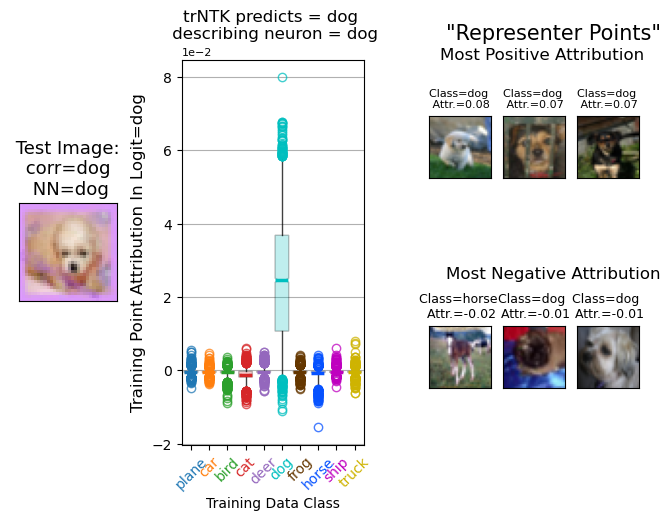

In [91]:
if True:
    #for index in np.where(test_y_plot != test_predictions)[0]:
    for index in [1999,]:
        OneVizDis(index,'trNTK')

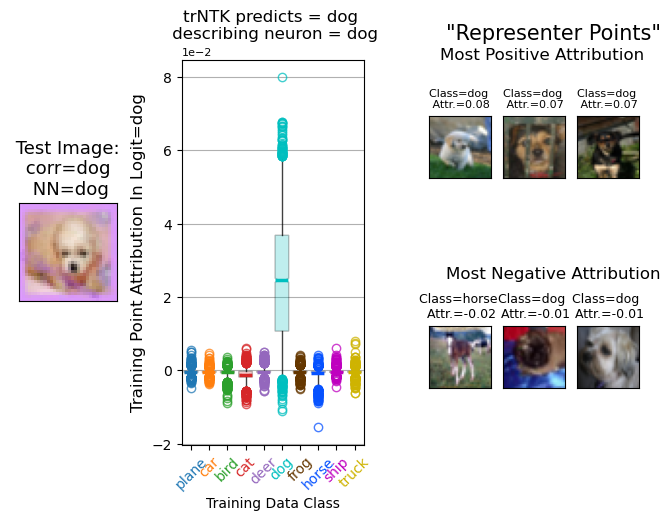

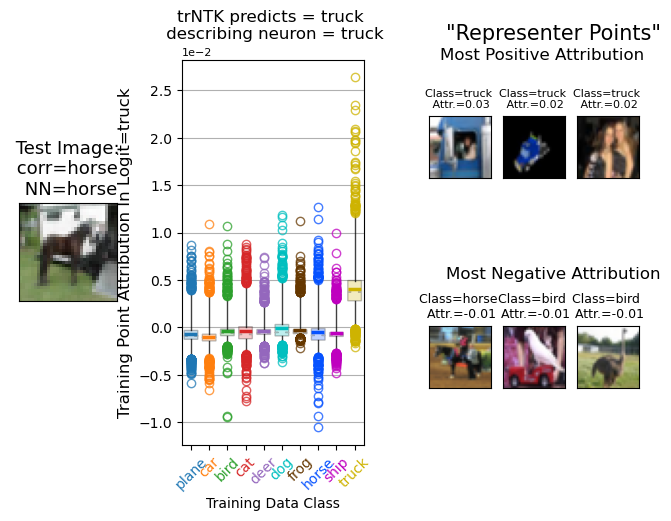

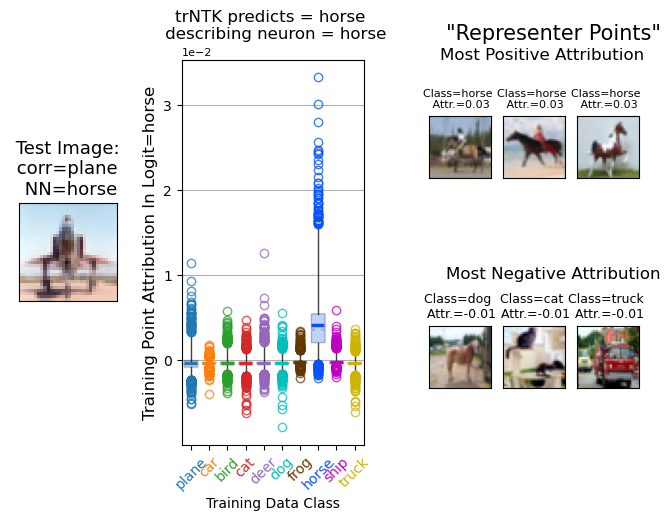

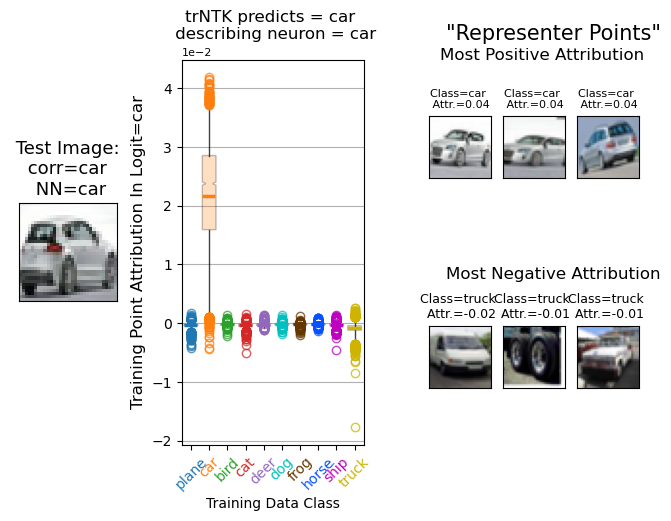

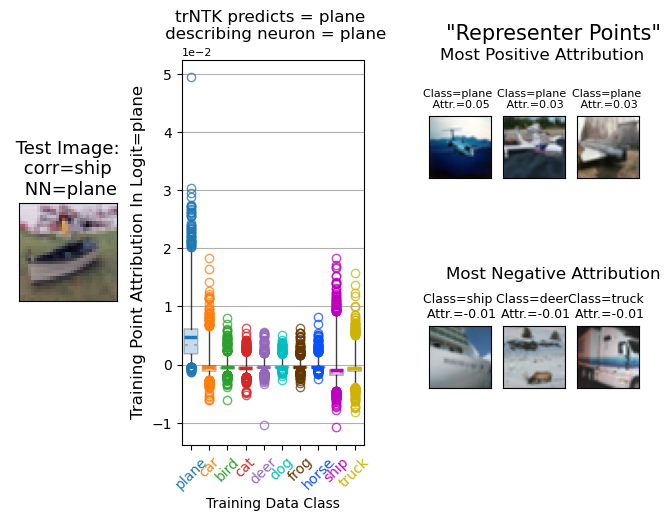

...

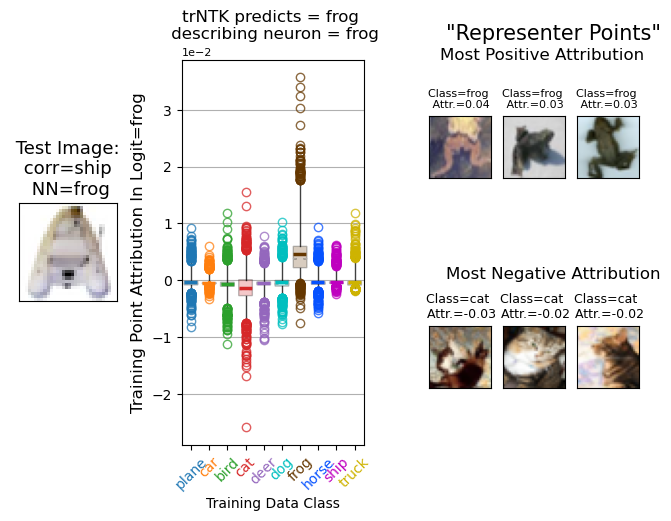

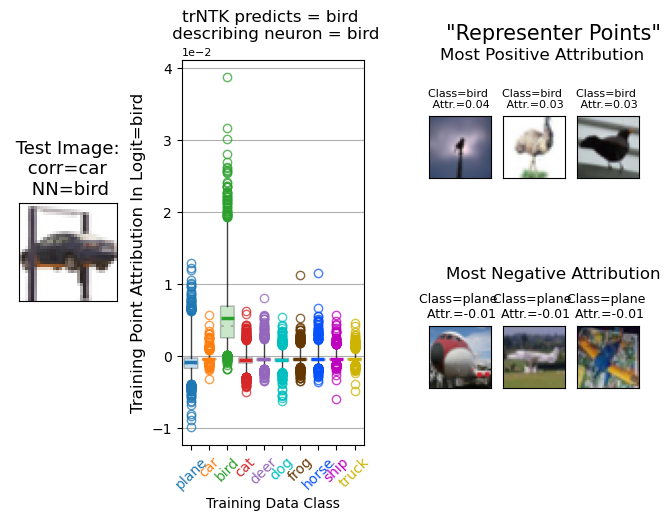

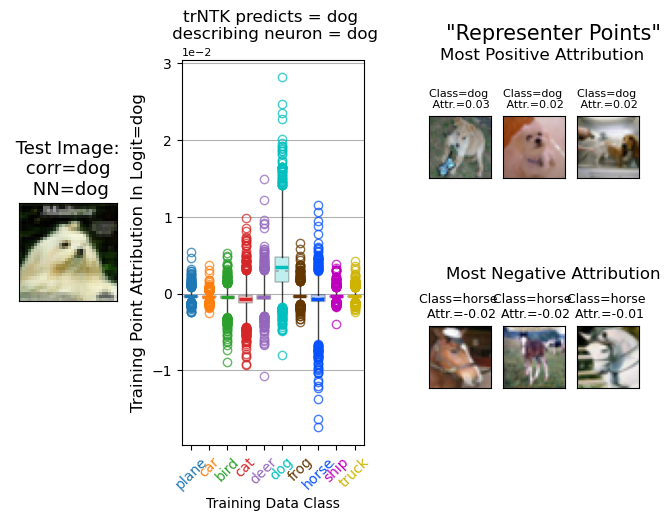

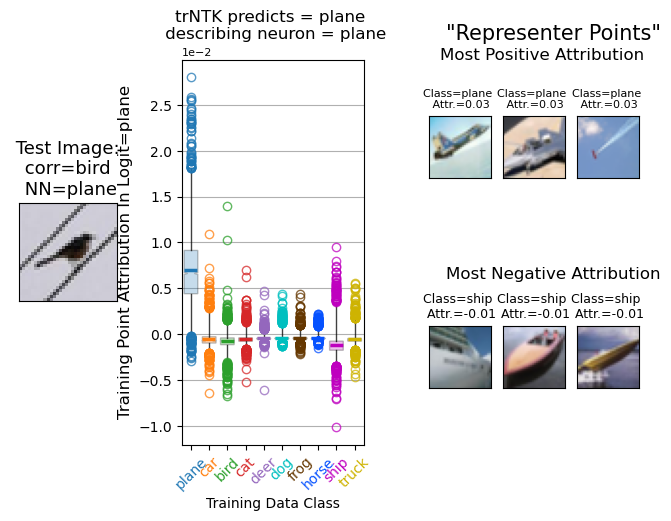

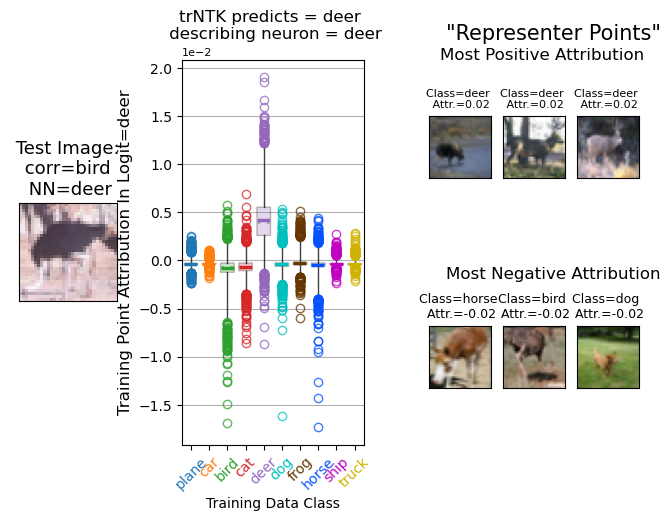

In [92]:
if True:
    #for index in np.where(test_y_plot != test_predictions)[0]:
    for index in [1999,20,4880,131,242,160,2533,3828,4747,731,2331]:
        OneVizDis(index,'trNTK')

# Visualizing the Complete Means for Any one logit

In [93]:
def AllLogitsVizDist(test_index,kernel_name,FLAG=False,HOTFIX=True):
    NAMES = np.array(['trNTK','trNTK0','proj-trNTK','proj-pNTK','Em','CK'])
    if not(kernel_name in NAMES):
        raise ValueError(f'kernel_name must be one of {NAMES}')
    
    Kernels = [K1,K1_0,K1_proj,K1_projpNTK,K1_Em,K1_CK]
    Weights = [K1_weights, K1_0weights, K1_projweights, K1_projpNTKweights, K1_Emweights, K1_CKweights]
    Intercepts = [K1_intercept, K1_0intercept, K1_projintercept, K1_projpNTKintercept, K1_Emintercept, K1_CKintercept]
    Predictions = [pNTK_predictions, pNTK0_predictions, proj_predictions, projpNTK_predictions, Em_predictions, CK_predictions]
    
    plt.rcParams['text.usetex'] = False
    fig = plt.figure(figsize=(6,4))
    outer = gridspec.GridSpec(1, 2, wspace=0.4, hspace=0.2, width_ratios=[1.0,4.0])
    
    #Plot the original and poisonsed test image
    inner = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=outer[0], wspace=0.1, hspace=0.2)

    ax = plt.Subplot(fig, inner[0])
    ax.imshow(test_x_plot[test_index])
    ax.set_title(f' Test Image: \n corr={cifar_labels[test_y_plot[test_index]]} \n NN={cifar_labels[test_predictions[test_index]]}',fontsize=13)
    ax.set_xticks([])
    ax.set_yticks([])
    fig.add_subplot(ax)
    

    #plt.suptitle('Visualizing Distribution of Attributions Across Logits',fontsize=16)
    
    inner = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=outer[1], wspace=0.2, hspace=0.2)
    
    
    for j,(Kernel,Kweights,Kintercept,KPredictions) in enumerate(zip(Kernels,Weights,Intercepts,Predictions)):
        if (kernel_name != NAMES[j]):
            continue
        ax = plt.Subplot(fig, inner[0])
        for i in range(10):
            if FLAG:
                axis = test_y_plot[i]
            else:
                axis = i #We are not paying attention to the effects of the other classes on my decision for this class.
            
            #HOTFIX 7/13/2023-- visualize all 10 classes everywhere.
            if HOTFIX: #FLAG should be False
                assert not(FLAG)
                for k in range(10):
                    mask = train_y_plot==k
                    c = colors[k]
                    K1s = Kernel[test_index,mask] * Kweights[axis,][mask].T + Kintercept[axis]/50_000
                    
                    if k == i:
                        dict_ = ax.boxplot(K1s,widths=0.75,positions=[i,],whis=(5,95),showfliers=False,patch_artist=True,labels=[cifar_labels_list[i],],
                                       meanline=True,
                                       notch=None,
                                       showmeans=True,
                                        boxprops=dict(facecolor=c, color='k',alpha=0.001),
                                        capprops=dict(color=c,alpha=0.001),
                                        whiskerprops=dict(color='k',alpha=0.001),
                                        flierprops=dict(color=c, markeredgecolor=c, alpha=0.25),
                                        meanprops=dict(color=c,linewidth=2.5),
                                        medianprops=dict(linestyle=None,linewidth=0))
                    else:
                        dict_ = ax.boxplot(K1s,widths=0.75,positions=[i,],whis=(5,95),showfliers=False,patch_artist=True,
                                       meanline=True,
                                       notch=None,
                                       showmeans=True,
                                        boxprops=dict(facecolor=c, color='k',alpha=0.001),
                                        capprops=dict(color=c,alpha=0.001),
                                        whiskerprops=dict(color='k',alpha=0.001),
                                        flierprops=dict(color=c, markeredgecolor=c, alpha=0.25),
                                        meanprops=dict(color=c,linewidth=2.5),
                                        medianprops=dict(linestyle=None,linewidth=0))
                
                logit_ = (Kernel[test_index,] @ Kweights[axis,].T + Kintercept[axis]/50_000)/50_000
                #print(i-0.4,i+0.4)
                #ax.hlines(logit_,i-0.4,i+0.4,color='k',linestyle='dashed',linewidth=3)
                ax.grid(True,axis='y')
                
            else:
                mask = train_y_plot==i
                c = colors[i]
                K1s = Kernel[test_index,mask] * Kweights[axis,][mask].T + Kintercept[axis]/5000 + (Kernel[test_index,~mask] * Kweights[axis,][~mask].T).sum()/5000 #shape = number of test DPs.

                dict_ = ax.boxplot(K1s,widths=0.75,positions=[i,],whis=(5,95),showfliers=True,patch_artist=True,labels=[cifar_labels_list[i],],
                                   meanline=True,
                                   notch=None,
                                   showmeans=True,
                                    boxprops=dict(facecolor=c, color='k'),
                                    capprops=dict(color=c),
                                    whiskerprops=dict(color='k',),
                                    flierprops=dict(color=c, markeredgecolor=c, alpha=0.25),
                                    meanprops=dict(color=c,linewidth=2.5),
                                    medianprops=dict(linestyle=None,linewidth=0))
                                

        
        ax.set_xticks(range(10),[r'$N_\mathrm{plane}$',
                                 r'$N_\mathrm{car}$',
                                 r'$N_\mathrm{bird}$',
                                 r'$N_\mathrm{cat}$',
                                 r'$N_\mathrm{deer}$',
                                 r'$N_\mathrm{dog}$',
                                 r'$N_\mathrm{frog}$',
                                 r'$N_\mathrm{horse}$',
                                 r'$N_\mathrm{ship}$',
                                 r'$N_\mathrm{truck}$'],rotation=45)
        #ax.tick_params?
        #
        ax.set_xlabel('Neuron',fontsize=10)
        for i in range(10):
            c = colors[i]
            ax.get_xticklabels()[i].set_color(c)
            #ax.get_xticklabels()[i].set_fontsize(20)
            
        #Now set legend
        pathches = []
        for i in range(10):
            patch = mpatches.Patch(color=colors[i], label=cifar_labels_list[i])
            pathches.append(patch)
        ax.legend(bbox_to_anchor=(1.0,-0.2),fontsize=9,handles=pathches,ncol=5)
        #ax.legend(loc='lower right',fontsize=10,handles=pathches)
        
        if NAMES[j] == 'trNTK0':
            ax.set_title(r'trNTK$^0$'+f' = {cifar_labels[int(KPredictions[test_index])]}',fontsize=12)
        else:
            ax.set_title(NAMES[j]+f" = {cifar_labels[int(KPredictions[test_index])]}",fontsize=12)
        ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
        #ax.set_xticklabels(fontdict={'fontsize': 20})
        #ax.set_yticklabels(fontdict={'fontsize': 8})
        #ax.tick_params(labelsize=8)
        ax.yaxis.get_offset_text().set_fontsize(8)
        ax.xaxis.get_offset_text().set_fontsize(12)
        ax.set_ylabel('Mean Attribution',fontsize=16)
        #ax.set_xticks([])
        
        fig.add_subplot(ax)
    
    #plt.tight_layout()
    #plt.savefig(f'/rcfs/projects/task0_pmml/images/OneMeanAttribution_{test_index}.pdf',bbox_inches='tight')
    plt.show()

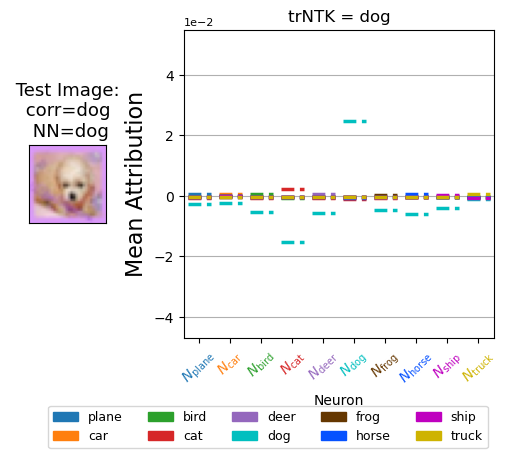

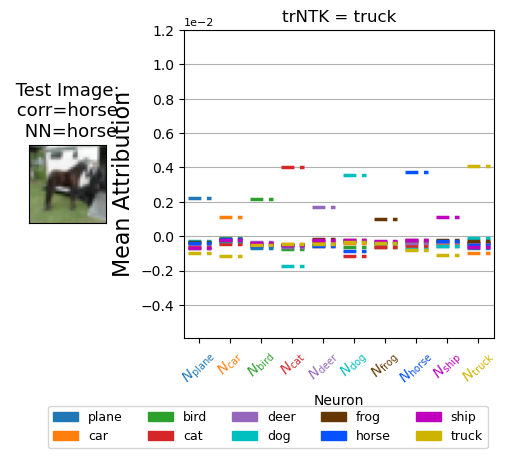

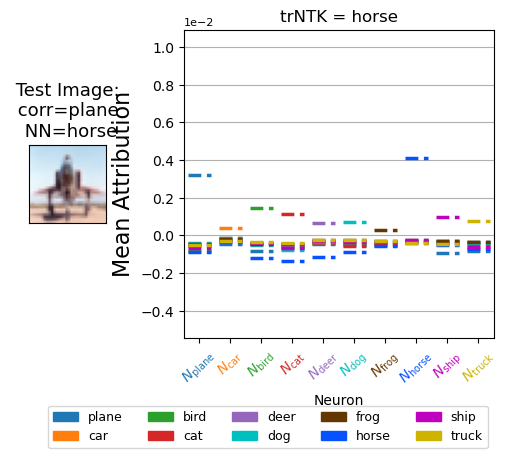

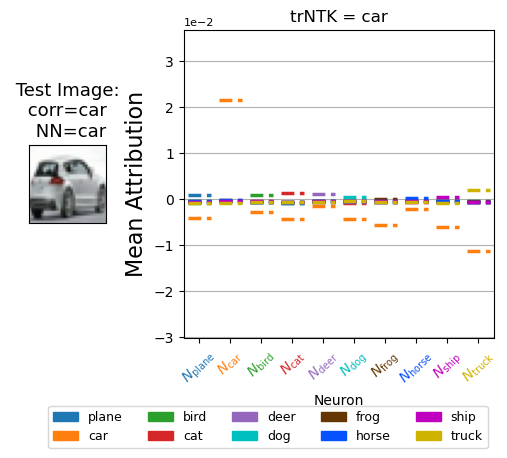

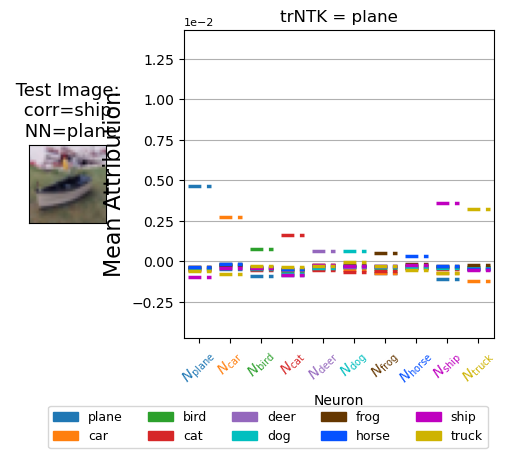

...

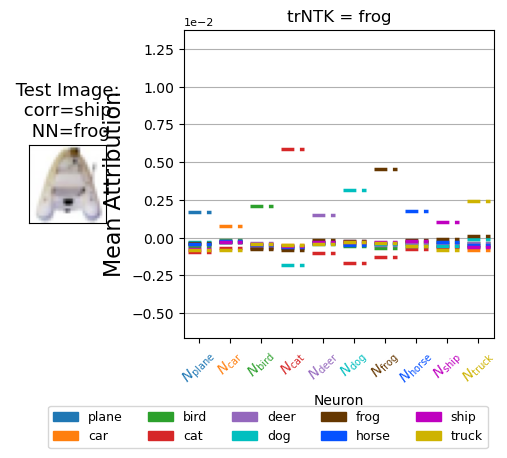

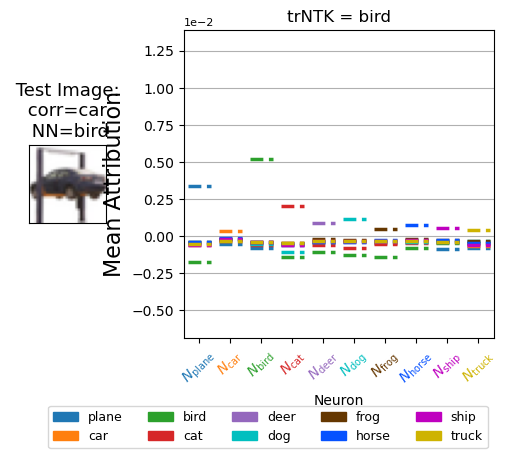

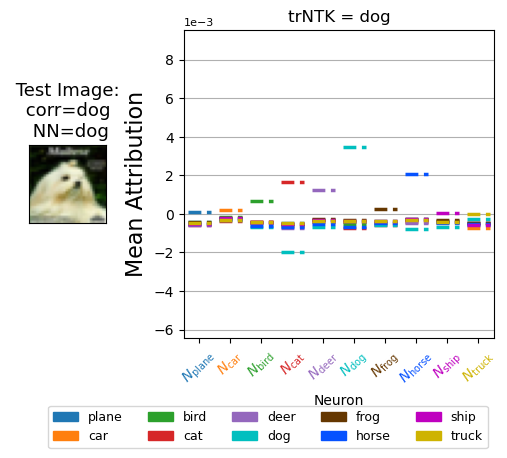

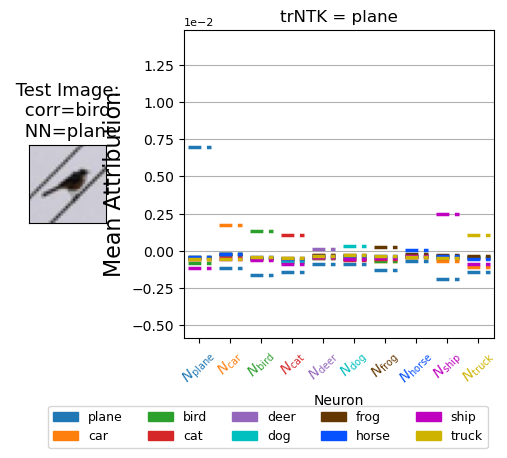

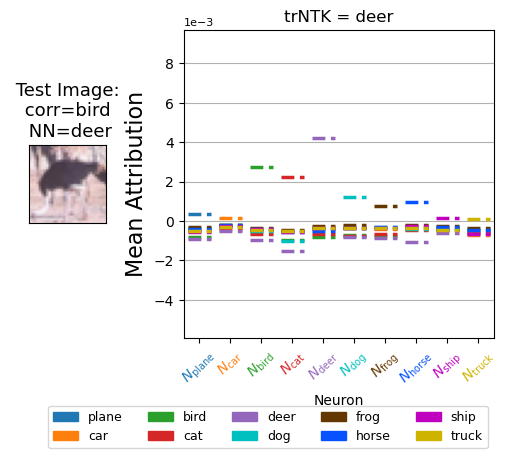

In [94]:
if True:
    #for index in np.where(test_y_plot != test_predictions)[0]:
    for index in [1999,20,4880,131,242,160,2533,3828,4747,731,2331]:
        AllLogitsVizDist(index,'trNTK')

# Compare All Attribution Visualizations

In [95]:
def CompareAllVizDist(test_index,FLAG=False,HOTFIX=True):
    plt.rcParams['text.usetex'] = False
    fig = plt.figure(figsize=(12,8))
    outer = gridspec.GridSpec(1, 2, wspace=0.1, hspace=0.1, width_ratios=[1,3.5])
    
    #Plot the original and poisonsed test image
    inner = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=outer[0], wspace=0.1, hspace=0.2)

    ax = plt.Subplot(fig, inner[0])
    ax.imshow(test_x_plot[test_index])
    ax.set_title(f' Test Image: \n corr={cifar_labels[test_y_plot[test_index]]} \n NN={cifar_labels[test_predictions[test_index]]}',fontsize=13)
    ax.set_xticks([])
    ax.set_yticks([])
    fig.add_subplot(ax)
    

    plt.suptitle('Visualizing Distribution of Attributions Across Kernels',fontsize=16)
    
    inner = gridspec.GridSpecFromSubplotSpec(2, 3, subplot_spec=outer[1], wspace=0.2, hspace=0.3)
    
    NAMES = np.array(['trNTK','trNTK0','proj-trNTK','proj-pNTK','Em','CK'])
    Kernels = [K1,K1_0,K1_proj,K1_projpNTK,K1_Em,K1_CK]
    Weights = [K1_weights, K1_0weights, K1_projweights, K1_projpNTKweights, K1_Emweights, K1_CKweights]
    Intercepts = [K1_intercept, K1_0intercept, K1_projintercept, K1_projpNTKintercept, K1_Emintercept, K1_CKintercept]
    Predictions = [pNTK_predictions, pNTK0_predictions, proj_predictions, projpNTK_predictions, Em_predictions, CK_predictions]
    for j,(Kernel,Kweights,Kintercept,KPredictions) in enumerate(zip(Kernels,Weights,Intercepts,Predictions)):
        ax = plt.Subplot(fig, inner[j])
        for i in range(10):
            if FLAG:
                axis = test_y_plot[i]
            else:
                axis = i #We are not paying attention to the effects of the other classes on my decision for this class.
            
            #HOTFIX 7/13/2023-- visualize all 10 classes everywhere.
            if HOTFIX: #FLAG should be False
                assert not(FLAG)
                for k in range(10):
                    mask = train_y_plot==k
                    c = colors[k]
                    K1s = Kernel[test_index,mask] * Kweights[axis,][mask].T + Kintercept[axis]/50_000
                    
                    if k == i:
                        dict_ = ax.boxplot(K1s,widths=0.75,positions=[i,],whis=(5,95),showfliers=False,patch_artist=True,labels=[cifar_labels_list[i],],
                                       meanline=True,
                                       notch=None,
                                       showmeans=True,
                                        boxprops=dict(facecolor=c, color='k',alpha=0.001),
                                        capprops=dict(color=c,alpha=0.001),
                                        whiskerprops=dict(color='k',alpha=0.001),
                                        flierprops=dict(color=c, markeredgecolor=c, alpha=0.25),
                                        meanprops=dict(color=c,linewidth=2.5),
                                        medianprops=dict(linestyle=None,linewidth=0))
                    else:
                        dict_ = ax.boxplot(K1s,widths=0.75,positions=[i,],whis=(5,95),showfliers=False,patch_artist=True,
                                       meanline=True,
                                       notch=None,
                                       showmeans=True,
                                        boxprops=dict(facecolor=c, color='k',alpha=0.001),
                                        capprops=dict(color=c,alpha=0.001),
                                        whiskerprops=dict(color='k',alpha=0.001),
                                        flierprops=dict(color=c, markeredgecolor=c, alpha=0.25),
                                        meanprops=dict(color=c,linewidth=2.5),
                                        medianprops=dict(linestyle=None,linewidth=0))
                
                logit_ = (Kernel[test_index,] @ Kweights[axis,].T + Kintercept[axis]/50_000)/50_000
                #print(i-0.4,i+0.4)
                #ax.hlines(logit_,i-0.4,i+0.4,color='k',linestyle='dashed',linewidth=3)
                ax.grid(True,axis='y')
                
            else:
                mask = train_y_plot==i
                c = colors[i]
                K1s = Kernel[test_index,mask] * Kweights[axis,][mask].T + Kintercept[axis]/5000   + (Kernel[test_index,~mask] * Kweights[axis,][~mask].T).sum()/5000 #shape = number of test DPs.

                dict_ = ax.boxplot(K1s,widths=0.75,positions=[i,],whis=(5,95),showfliers=True,patch_artist=True,labels=[cifar_labels_list[i],],
                                   meanline=True,
                                   notch=None,
                                   showmeans=True,
                                    boxprops=dict(facecolor=c, color='k'),
                                    capprops=dict(color=c),
                                    whiskerprops=dict(color='k',),
                                    flierprops=dict(color=c, markeredgecolor=c, alpha=0.25),
                                    meanprops=dict(color=c,linewidth=2.5),
                                    medianprops=dict(linestyle=None,linewidth=0))
                                

        
        ax.set_xticks(range(10),['plane','car','bird','cat','deer','dog','frog','horse','ship','truck'],rotation=45)
        #ax.set_xtickslabels(fontdict={'fontsize': 20})
        #ax.set_ytickslabels(fontdict={'fontsize': 8})
        if j==2:
            pathches = []
            for i in range(10):
                patch = mpatches.Patch(color=colors[i], label=cifar_labels_list[i])
                pathches.append(patch)
            ax.legend(bbox_to_anchor=(1.05,1.0),fontsize=10,handles=pathches)
        if NAMES[j] == 'pNTK0':
            ax.set_title(r'pNTK$^0$'+f' = {cifar_labels[int(KPredictions[test_index])]}',fontsize=12)
        else:
            ax.set_title(NAMES[j]+f" = {cifar_labels[int(KPredictions[test_index])]}",fontsize=12)
        ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
        #ax.tick_params(labelsize=8)
        #ax.yaxis.get_offset_text().set_fontsize(8)
        #ax.set_xticks([])
        ax.yaxis.get_offset_text().set_fontsize(6)
        ax.xaxis.get_offset_text().set_fontsize(12)
        
        for i in range(10):
            c = colors[i]
            ax.get_xticklabels()[i].set_color(c)
        
        fig.add_subplot(ax)
    
    #plt.tight_layout()
    #plt.savefig(f'/rcfs/projects/task0_pmml/images/AttributionDistALLHotFix_noline_{test_index}.pdf',bbox_inches='tight')
    plt.show()

In [96]:
indices_wrong = np.where(test_y_plot != test_predictions)[0]
for i in range(10):
    print(cifar_labels[i],'{:.3f}'.format((test_predictions[indices_wrong]==i).sum()/len(indices_wrong)))
    
#If purely random, dog and cat would be wrong 10% of the time, but combined they make up about 40% of incorrect
#classes. What can explain?

plane 0.109
car 0.042
bird 0.128
cat 0.205
deer 0.092
dog 0.174
frog 0.055
horse 0.045
ship 0.077
truck 0.073


In [97]:
#indices_wrong = np.where(test_y_plot != test_predictions)[0]
print(test_y_plot[indices_wrong][test_predictions[indices_wrong]==3])
print(test_y_plot[indices_wrong][test_predictions[indices_wrong]==5])
#

[0 6 7 5 5 7 5 5 5 5 5 5 6 0 6 5 7 6 5 5 2 5 6 8 8 2 5 0 5 5 5 6 2 6 5 6 5
 4 6 2 5 6 7 5 5 6 2 6 6 2 4 5 4 4 5 4 8 5 5 5 7 2 5 5 2 2 4 5 6 5 2 0 5 6
 9 5 5 5 5 6 5 5 5 2 2 6 5 5 4 5 6 4 5 5 6 4 5 2 2 8 5 7 4 5 5 5 2 6 4 5 2
 2 4 6 2 5 5 7 5 5 5 4 5 8 6 4 6 2 2 5 5 5 7 5 5 5 5 7 5 2 6]
[4 3 2 3 3 2 4 3 3 2 3 4 3 4 3 3 7 3 3 3 3 6 3 3 7 3 6 4 3 3 3 4 3 3 3 7 3
 3 7 3 3 3 8 3 3 3 3 6 2 4 4 3 2 1 3 3 3 3 7 7 3 4 3 3 2 3 3 7 3 3 3 3 3 3
 6 3 3 2 3 4 7 3 6 3 3 2 2 3 2 4 3 3 3 3 3 3 3 2 3 3 7 3 3 2 3 3 7 3 3 7 3
 3 3 3 3 7 3 2 3 3]


# This figure does not address the fundamental issue of whether the importance of a few points over the average of the entire similarity.

# Therefore do not add into revision because it just invites more attention. but fix for ICLR

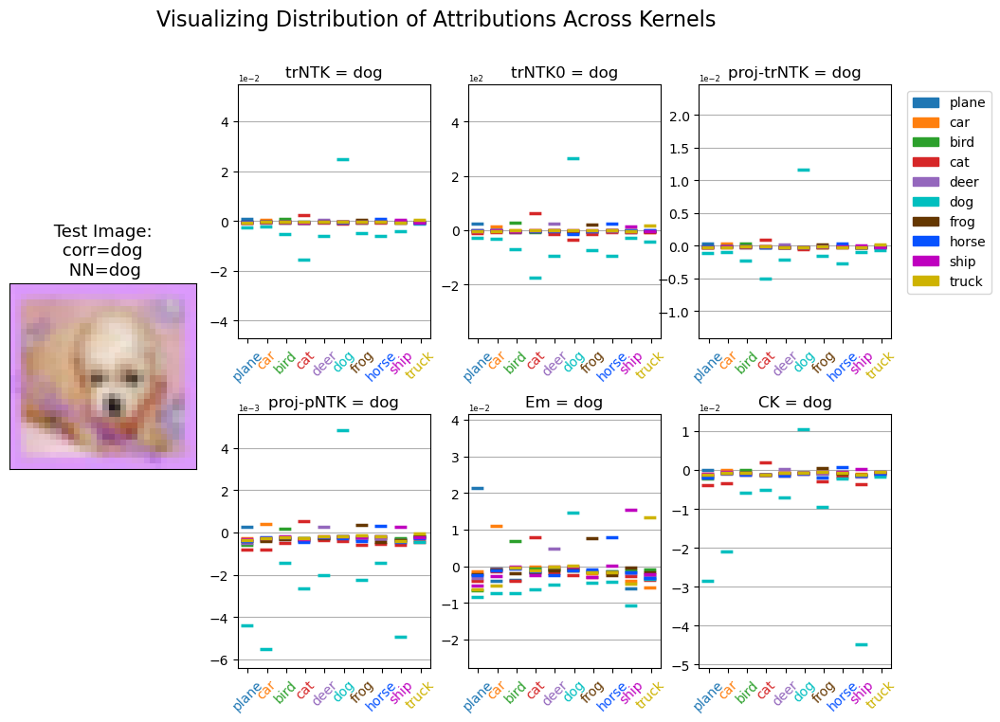

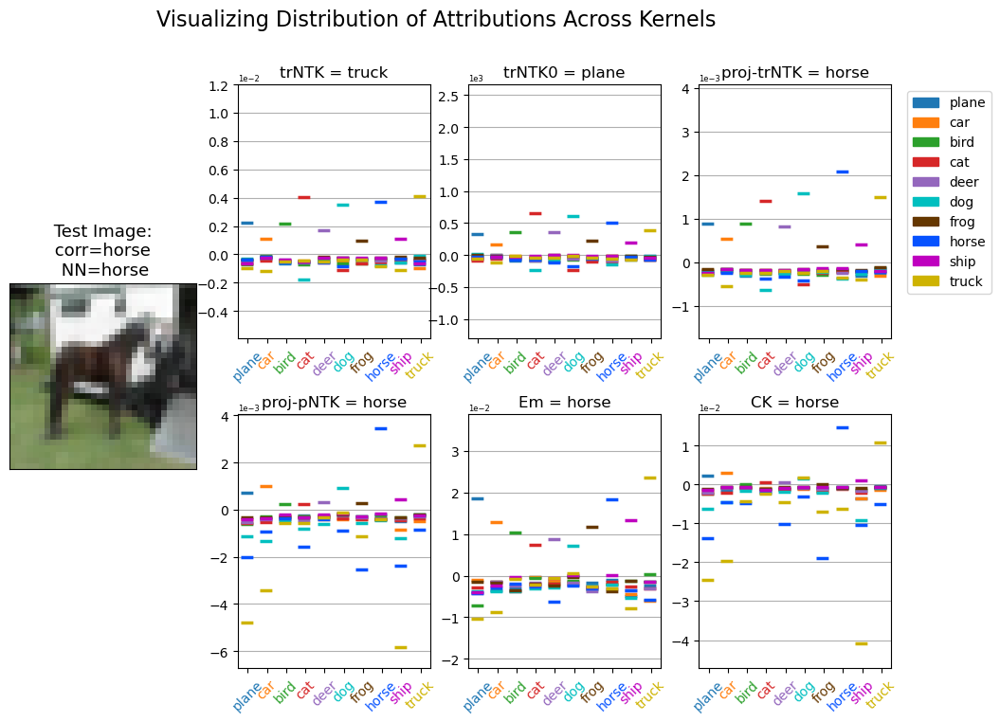

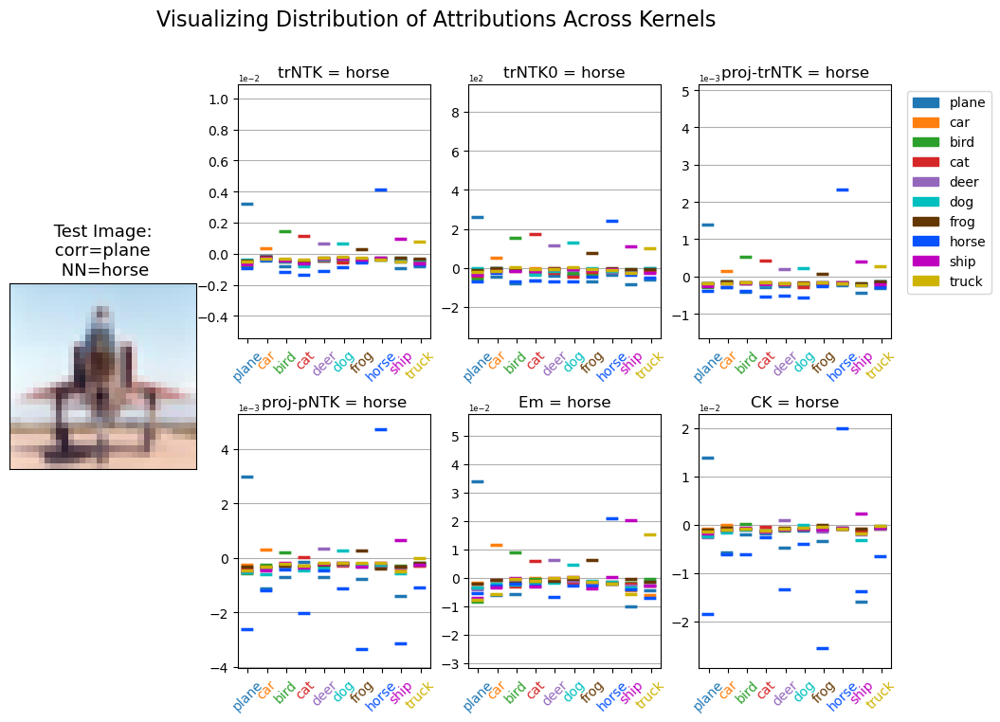

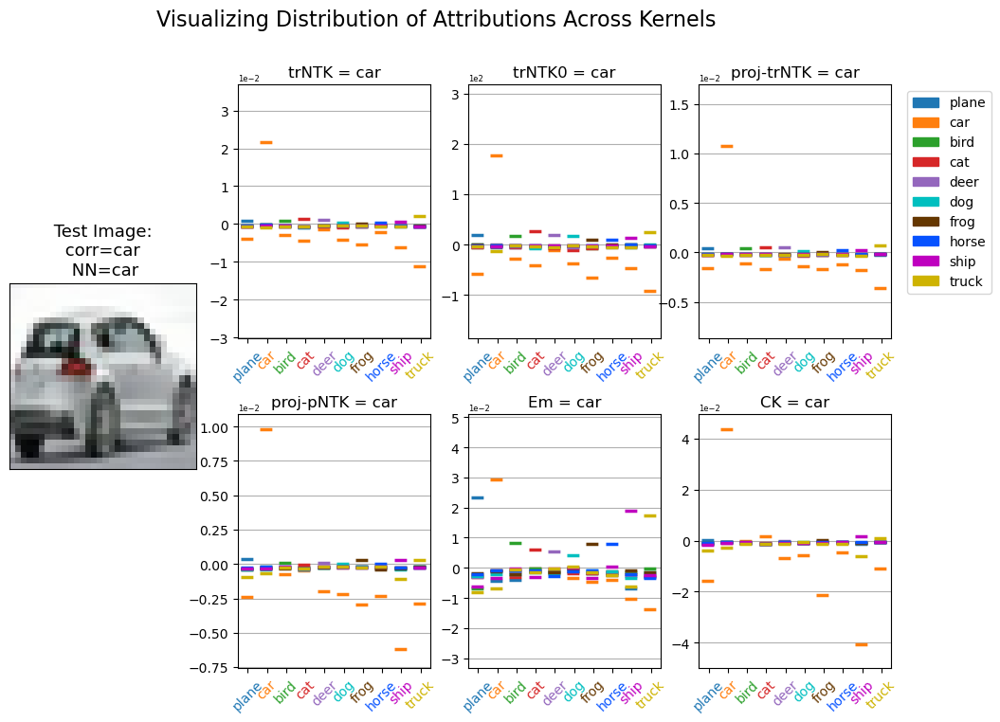

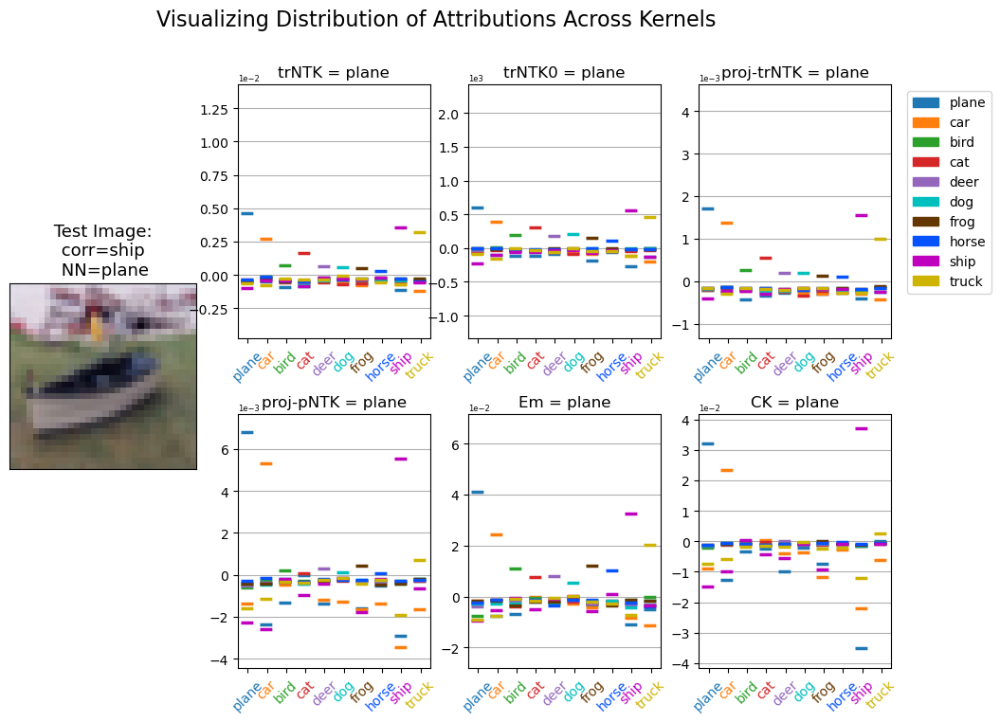

...

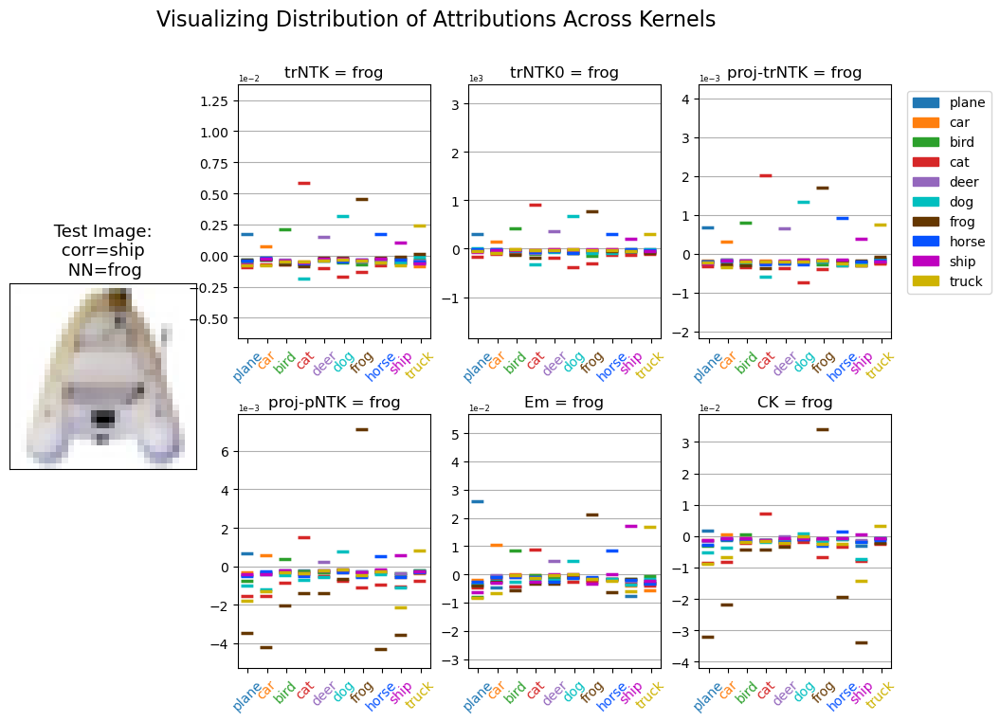

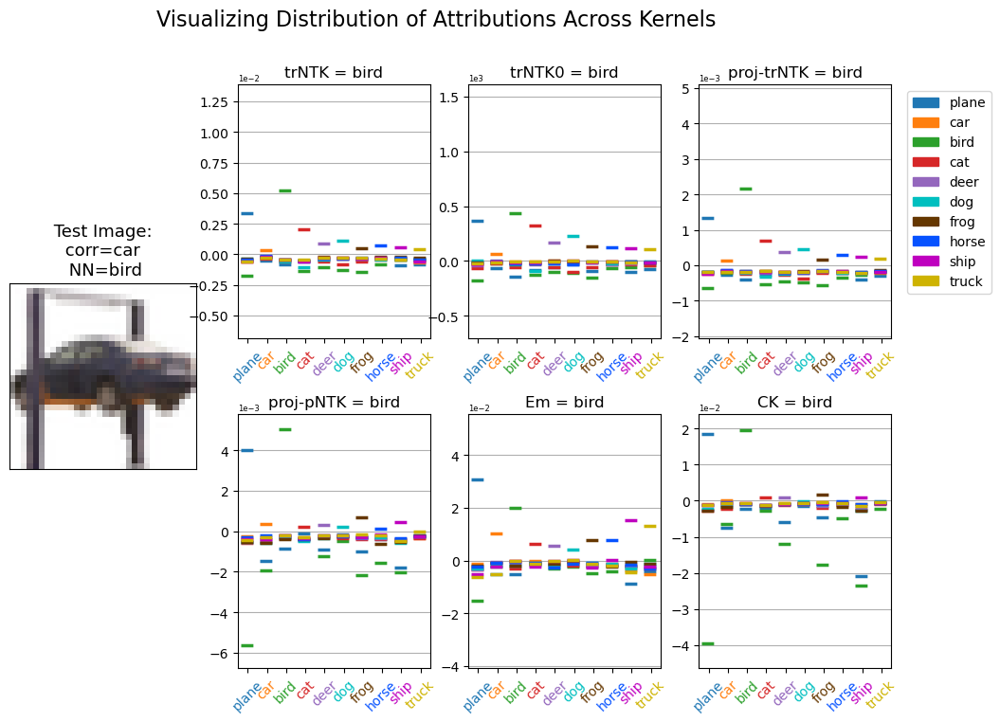

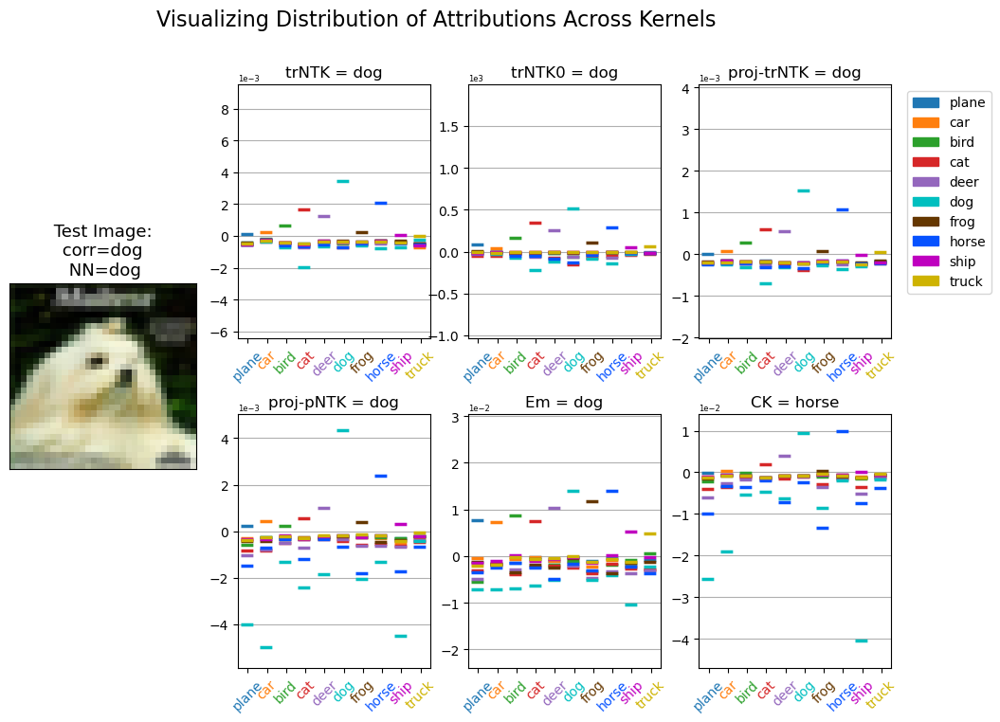

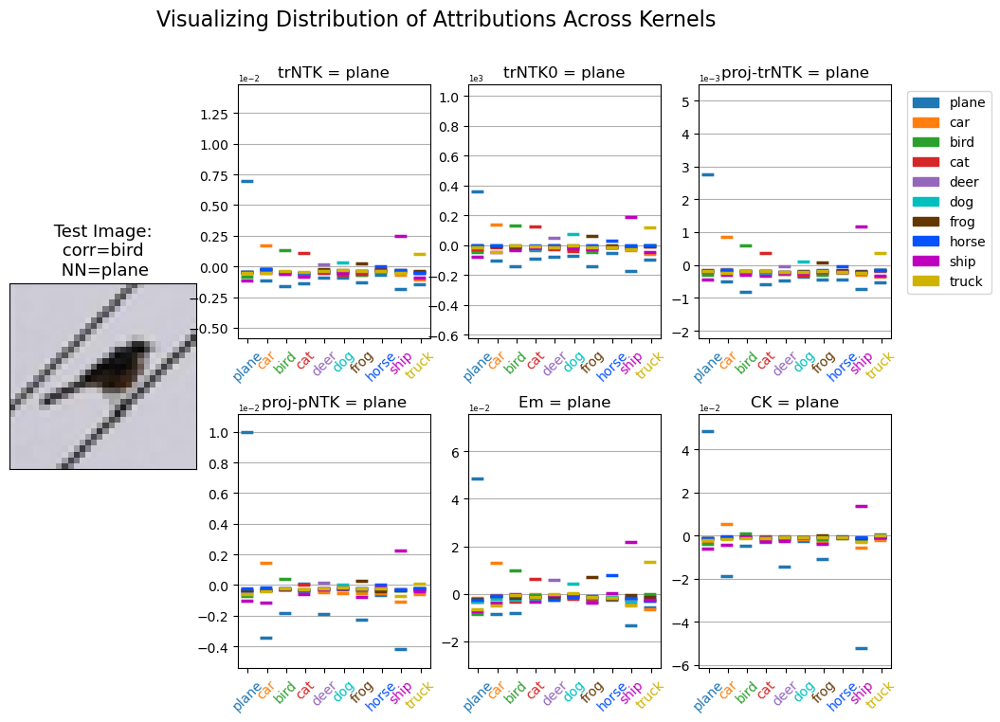

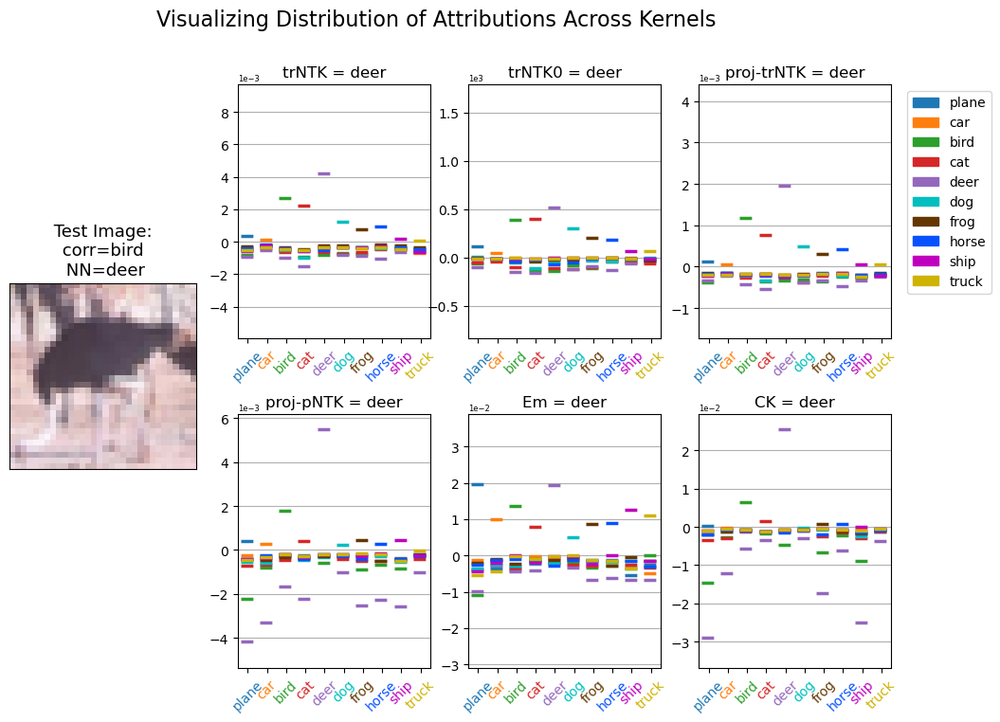

In [98]:
#1999
#20
#4880
#131
#4880 #1999, 131, 242, 160, 2533, 3828, 4747, 731, 2331

#PAPER
# 
if True:
    #for index in np.where(test_y_plot != test_predictions)[0]:
    for index in [1999,20,4880,131,242,160,2533,3828,4747,731,2331]:
        CompareAllVizDist(index)

# Same thing but we normalize each by the total mass

In [117]:
def CompareAllVizDistMass(test_index,FLAG=False):
    fig = plt.figure(figsize=(12,6))
    outer = gridspec.GridSpec(1, 2, wspace=0.1, hspace=0.1, width_ratios=[1,3.5])
    
    
    inner = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=outer[0], wspace=0.1, hspace=0.2)

    ax = plt.Subplot(fig, inner[0])
    ax.imshow(test_x_plot[test_index])
    ax.set_title(f' Test Image: \n corr={cifar_labels[test_y_plot[test_index]]} \n NN={cifar_labels[test_predictions[test_index]]}',fontsize=13)
    ax.set_xticks([])
    ax.set_yticks([])
    fig.add_subplot(ax)
    

    plt.suptitle('Visualizing Distribution of Attributions Across Kernels',fontsize=16)
    
    inner = gridspec.GridSpecFromSubplotSpec(2, 3, subplot_spec=outer[1], wspace=0.2, hspace=0.2)
    
    NAMES = np.array(['trNTK','trNTK0','proj-trNTK','proj-pNTK','Em','CK'])
    Kernels = [K1,K1_0,K1_proj,K1_projpNTK,K1_Em,K1_CK]
    Weights = [K1_weights, K1_0weights, K1_projweights, K1_projpNTKweights, K1_Emweights, K1_CKweights]
    Intercepts = [K1_intercept, K1_0intercept, K1_projintercept, K1_projpNTKintercept, K1_Emintercept, K1_CKintercept]
    Predictions = [pNTK_predictions, pNTK0_predictions, proj_predictions, projpNTK_predictions, Em_predictions, CK_predictions]
    
    
    for j,(Kernel,Kweights,Kintercept,KPredictions) in enumerate(zip(Kernels,Weights,Intercepts,Predictions)):
        ax = plt.Subplot(fig, inner[j])
        axis = int(KPredictions[test_index]) #this visualizes the effects of each class on one logit
        for i in range(10):
            mask = train_y_plot==i
            c = colors[i]
            
            K1s = Kernel[test_index,mask] * Kweights[axis,][mask].T + Kintercept[axis]/(Kweights.shape[1]) 
            dict_ = ax.boxplot(K1s,widths=0.75,positions=[i,],whis=(1,99),showfliers=True,patch_artist=True,labels=[cifar_labels_list[i],],
                       meanline=True,
                       notch=True,
                       showmeans=True,
                        boxprops=dict(facecolor=c, color='k',alpha=0.25),
                        capprops=dict(color=c,alpha=0.75),
                        whiskerprops=dict(color='k',alpha=0.75),
                        flierprops=dict(color=c, markeredgecolor=c, alpha=0.75),
                        meanprops=dict(color=c,linewidth=2.5),
                        medianprops=dict(linestyle=None,linewidth=0))
                                

            
        if j==2:
            pathches = []
            for i in range(10):
                patch = mpatches.Patch(color=colors[i], label=cifar_labels_list[i])
                pathches.append(patch)
            ax.legend(bbox_to_anchor=(1.05,1.0),fontsize=10,handles=pathches)
        ax.set_title(NAMES[j]+f" = {cifar_labels[int(KPredictions[test_index])]}",fontsize=12)
        ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
        ax.tick_params(labelsize=8)
        ax.yaxis.get_offset_text().set_fontsize(8)
        ax.set_xticks([])
        
        fig.add_subplot(ax)
    
    #plt.tight_layout()
    plt.savefig(f'/rcfs/projects/task0_pmml/images/AttributionDistALLMass_{test_index}.png',bbox_inches='tight')
    plt.show()

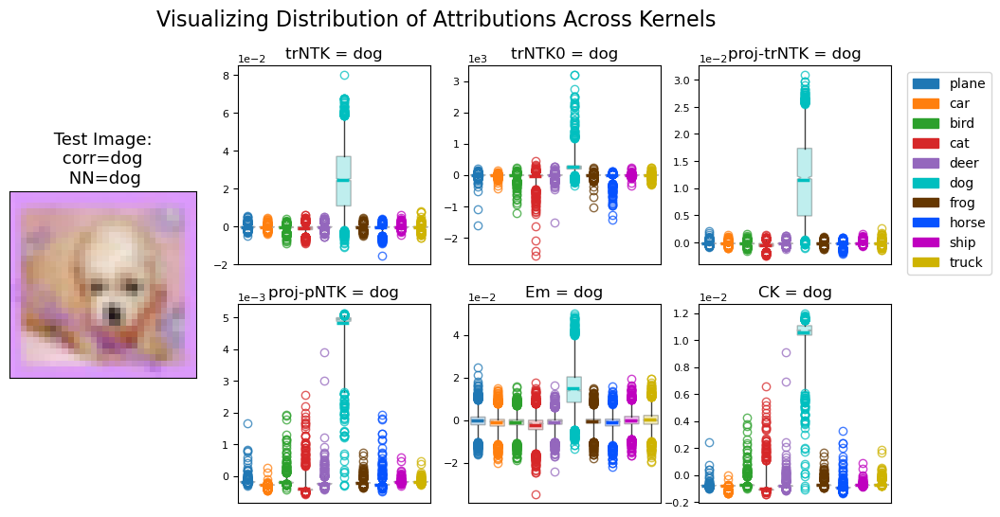

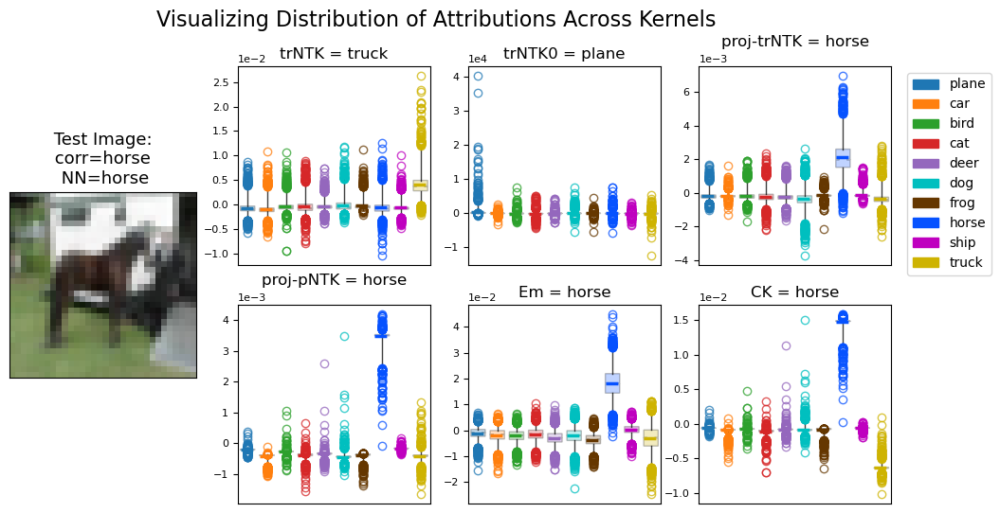

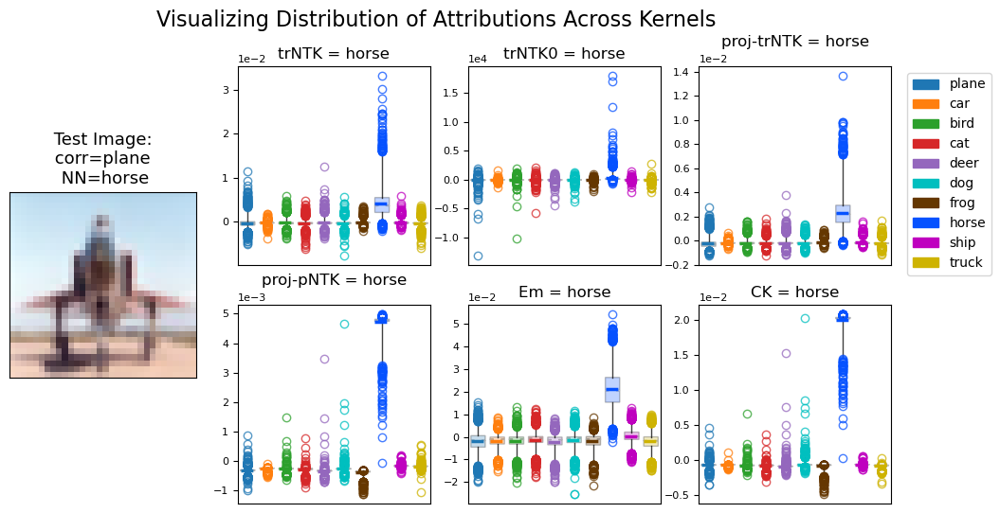

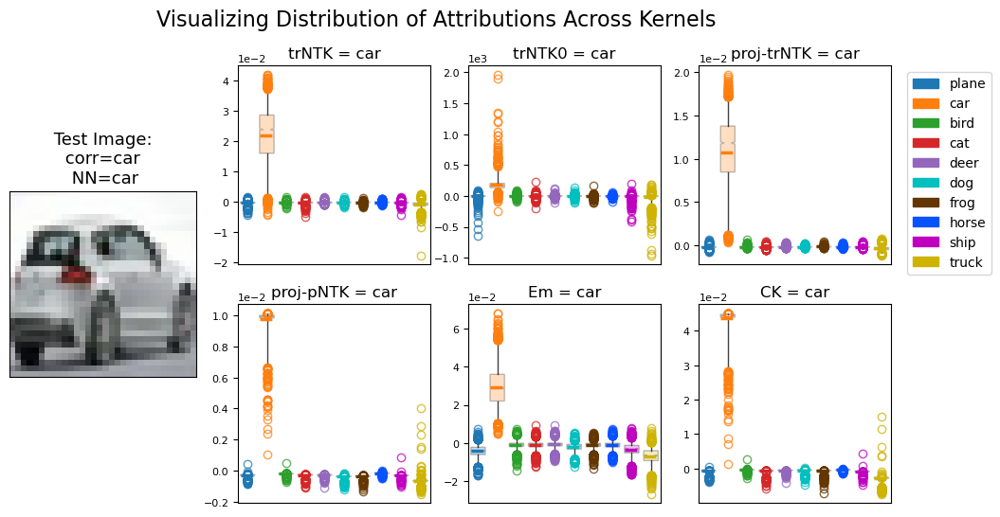

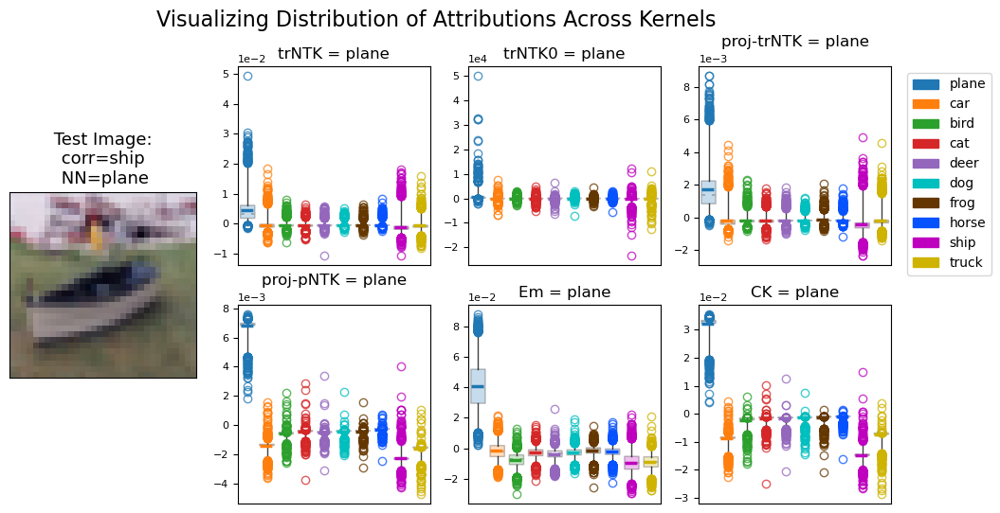

...

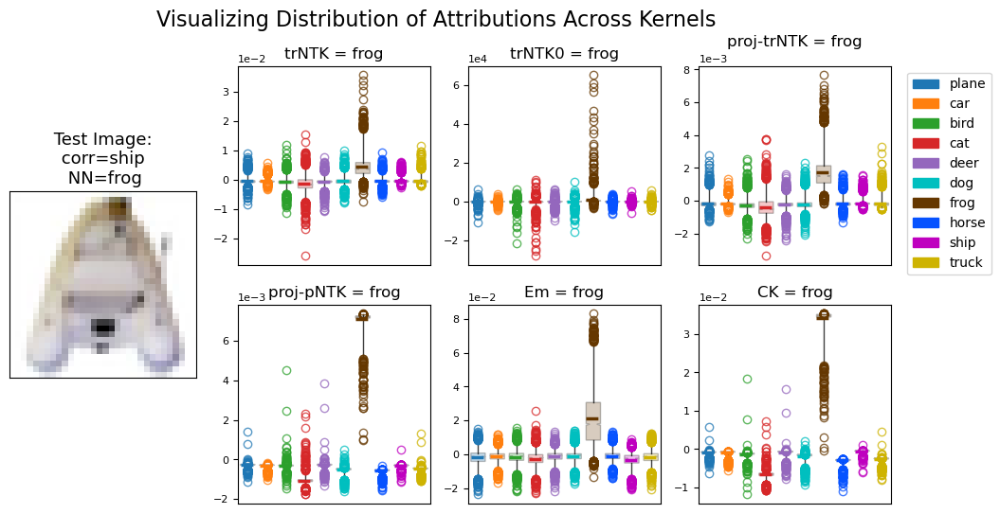

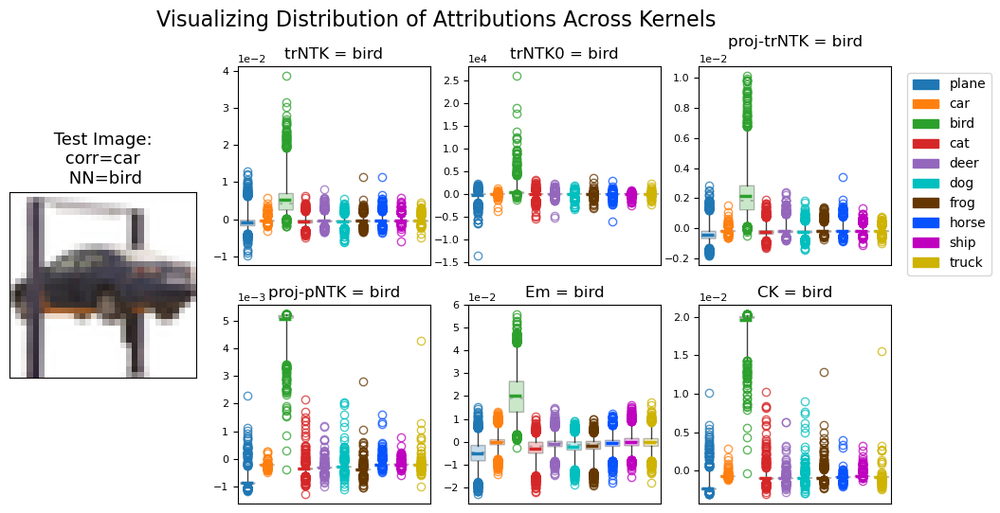

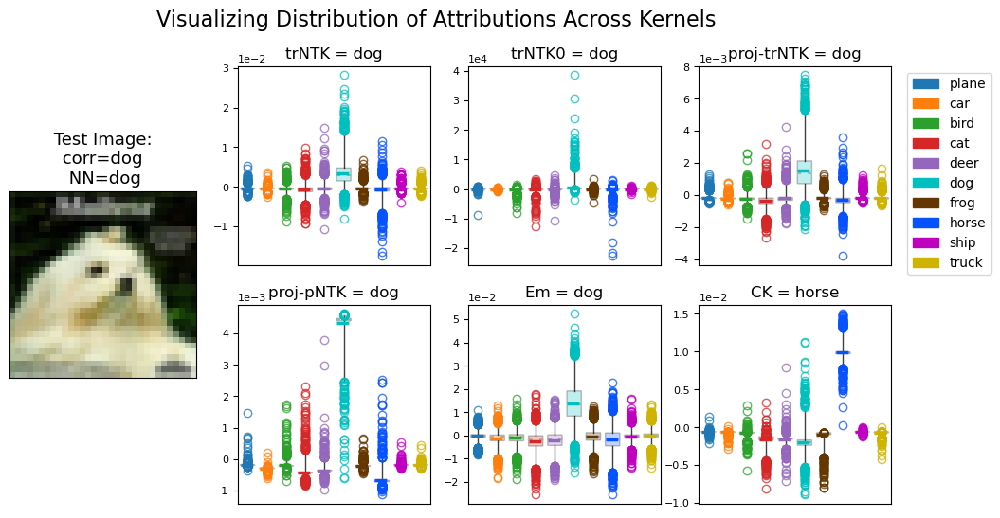

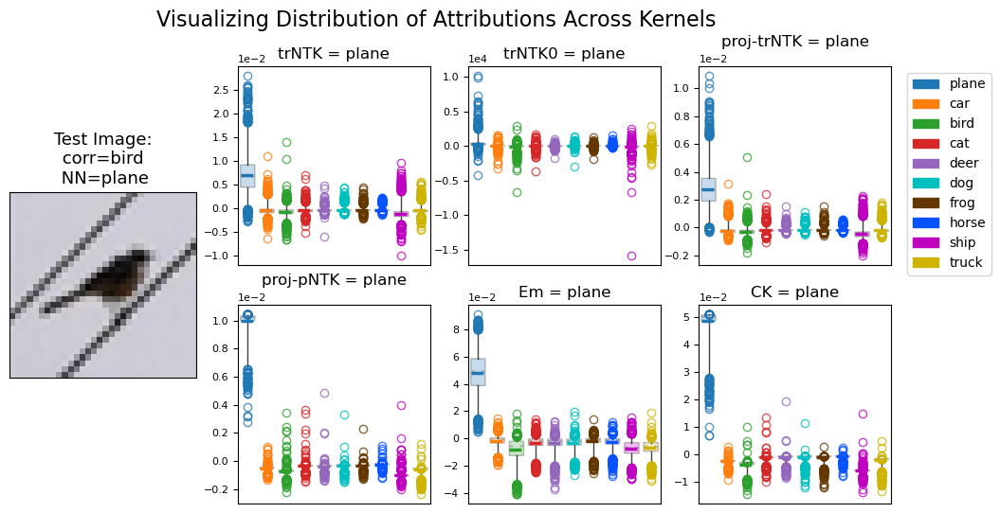

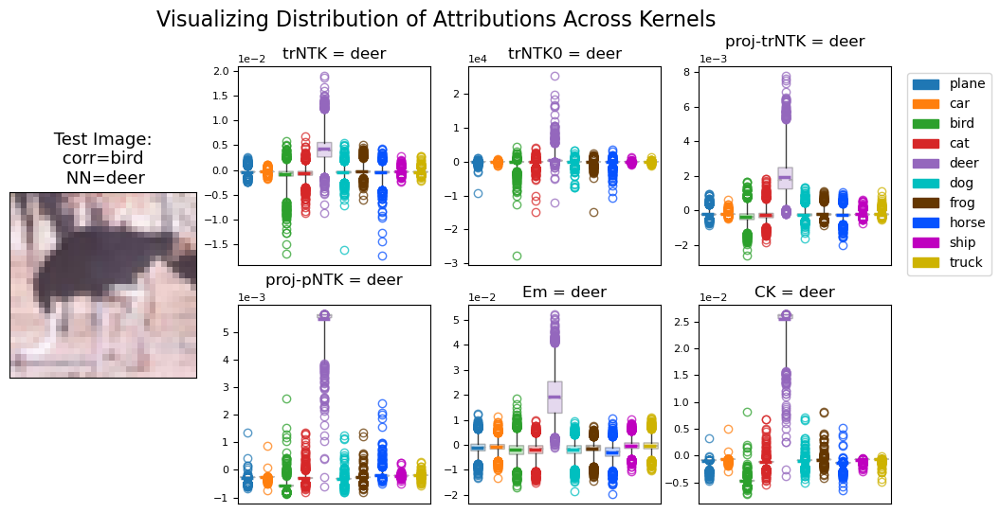

In [118]:
if True:
    for index in [1999,20,4880,131,242,160,2533,3828,4747,731,2331]:
        CompareAllVizDistMass(index)

# What quantile does the mean exist on?

In [107]:
K1_weights

(10, 50000)

In [108]:
K1.shape

(10000, 50000)

In [113]:
class_mask = train_y_plot==0

In [114]:
class_means = (K1[:,class_mask] @ K1_weights[:,class_mask].T)/5000 + K1_intercept/5000

class_


In [116]:
out #class means

array([[-0.00312424, -0.0023087 , -0.00449378, ..., -0.00301257,
        -0.00372831, -0.00578139],
       [-0.00217803, -0.00227301, -0.00439508, ..., -0.00302835,
        -0.00390567, -0.00557089],
       [-0.00281968, -0.00224414, -0.0042761 , ..., -0.00300444,
        -0.00370026, -0.00541621],
       ...,
       [-0.00361725, -0.00224093, -0.00440619, ..., -0.00298902,
        -0.00366516, -0.00572055],
       [-0.00290271, -0.00237201, -0.00451805, ..., -0.00305386,
        -0.00375491, -0.00574094],
       [-0.00322528, -0.00231081, -0.00449791, ..., -0.00304731,
        -0.00374979, -0.00583405]])

In [ ]:
def outlier_analysis():
    NAMES = np.array(['trNTK','trNTK0','proj-trNTK','proj-pNTK','Em','CK'])
    Kernels = [K1,K1_0,K1_proj,K1_projpNTK,K1_Em,K1_CK]
    Weights = [K1_weights, K1_0weights, K1_projweights, K1_projpNTKweights, K1_Emweights, K1_CKweights]
    Intercepts = [K1_intercept, K1_0intercept, K1_projintercept, K1_projpNTKintercept, K1_Emintercept, K1_CKintercept]
    Predictions = [pNTK_predictions, pNTK0_predictions, proj_predictions, projpNTK_predictions, Em_predictions, CK_predictions]
    for j,(Kernel,Kweights,Kintercept,KPredictions) in enumerate(zip(Kernels,Weights,Intercepts,Predictions)):
        Kernels

# Generate Attribution Examples

In [114]:
def CompareAllViz(test_index,):
    plt.rcParams['text.usetex'] = False
    fig = plt.figure(figsize=(10,6))
    outer = gridspec.GridSpec(1, 2, wspace=0.1, hspace=0.2, width_ratios=[1,3])

    #Plot the original and poisonsed test image
    inner = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=outer[0], wspace=0.1, hspace=0.1)

    ax = plt.Subplot(fig, inner[0])
    ax.imshow(test_x_plot[test_index])
    ax.set_title(f'Test Image \n corr={cifar_labels[test_y_plot[test_index]]} \n NN={cifar_labels[test_predictions[test_index]]}',fontsize=13)
    ax.set_xticks([])
    ax.set_yticks([])
    fig.add_subplot(ax)

    plt.suptitle('Visualizing Most Similar Across Kernels ResNet18',fontsize=16)

    inner = gridspec.GridSpecFromSubplotSpec(5, 6, subplot_spec=outer[1], wspace=0.1, hspace=0.1)
    NAMES = np.array(['trNTK','trNTK0','proj-trNTK','proj-pNTK','Em','CK'])
    Kernels = [K1,K1_0,K1_proj,K1_projpNTK,K1_Em,K1_CK]
    #Weights = [K1_weights, K1_0weights, K1_projweights, K1_projpNTKweights, K1_Emweights, K1_CKweights]
    #Intercepts = [K1_intercept, K1_0intercept, K1_projintercept, K1_projpNTKintercept, K1_Emintercept, K1_CKintercept]
    #Predictions = [pNTK_predictions, pNTK0_predictions, proj_predictions, projpNTK_predictions, Em_predictions, CK_predictions]
    for j,Kernel in enumerate(Kernels):
        attribution_indices1 = np.argsort(Kernel[test_index,0:50_000])[-5::][::-1]
        for i,index in enumerate(attribution_indices1):
            ax = plt.Subplot(fig, inner[6*i+j])        
            ax.set_xticks([])
            ax.set_yticks([])
            ax.imshow(train_x_plot[index])
            if i == 0:
                if NAMES[j] == 'trNTK0':
                    ax.set_title('trNTK$^0$',fontsize=12)
                else:
                    ax.set_title(NAMES[j],fontsize=12)
            fig.add_subplot(ax)
    
    plt.tight_layout()
    #plt.savefig(f'/rcfs/projects/task0_pmml/images/AttributionALL_{test_index}.pdf')
    plt.show()

/tmp/ipykernel_231500/2821760585.py:38: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


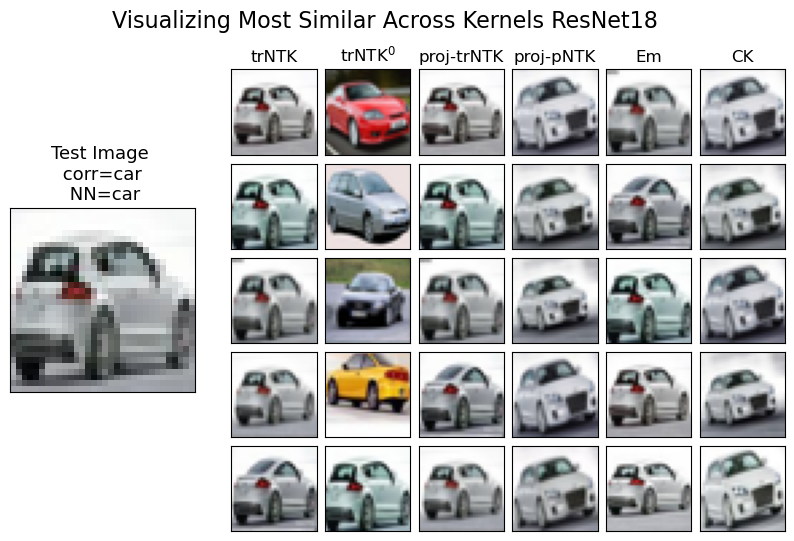

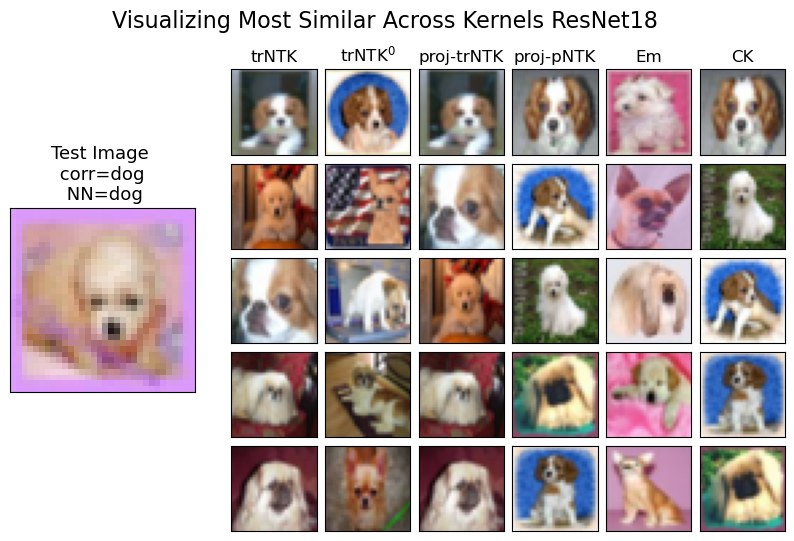

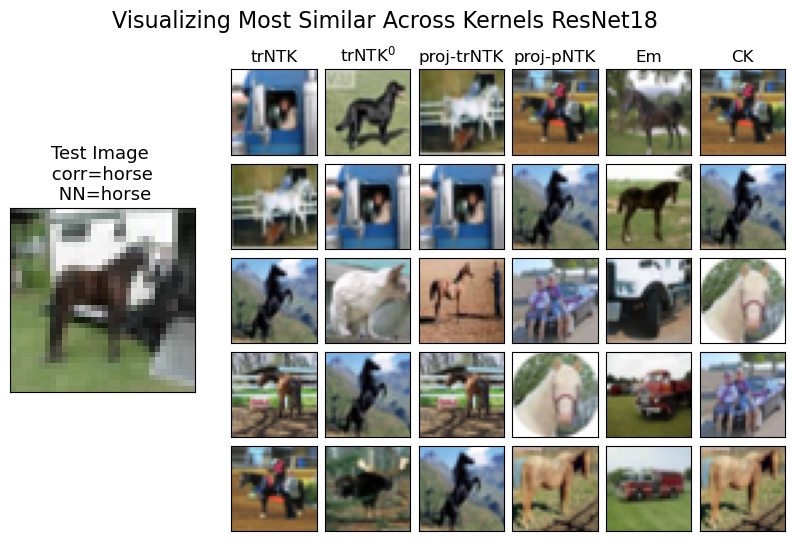

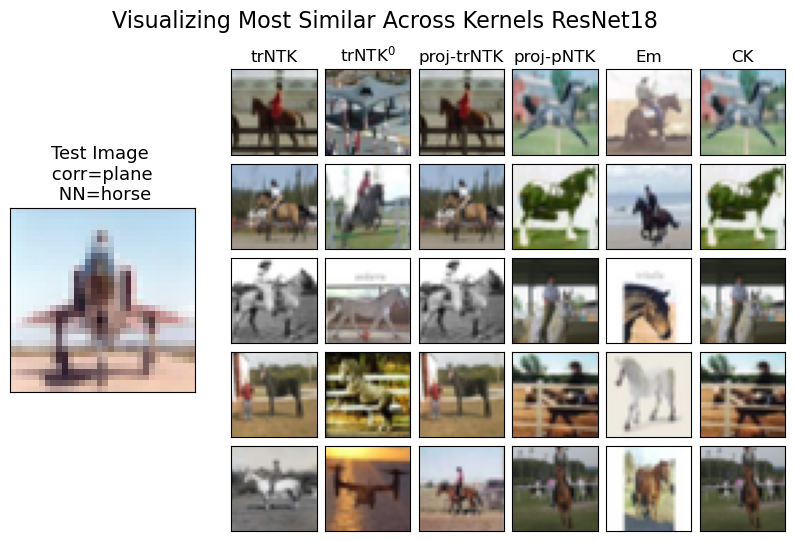

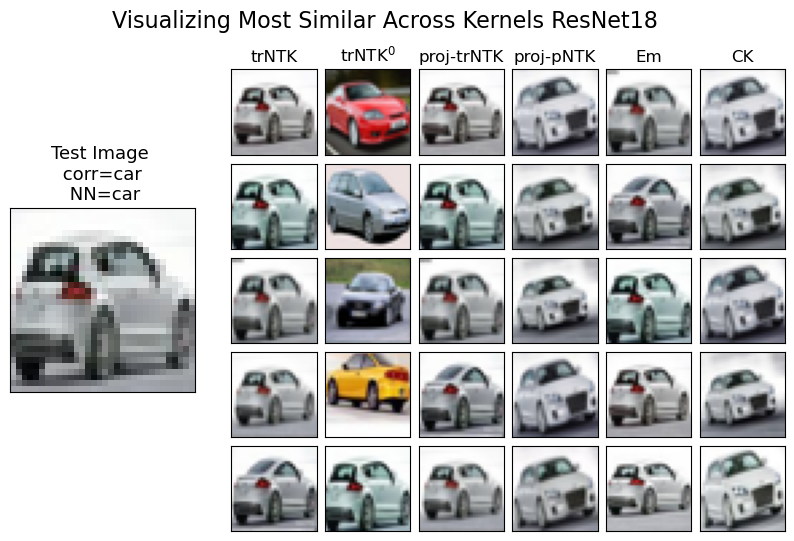

...

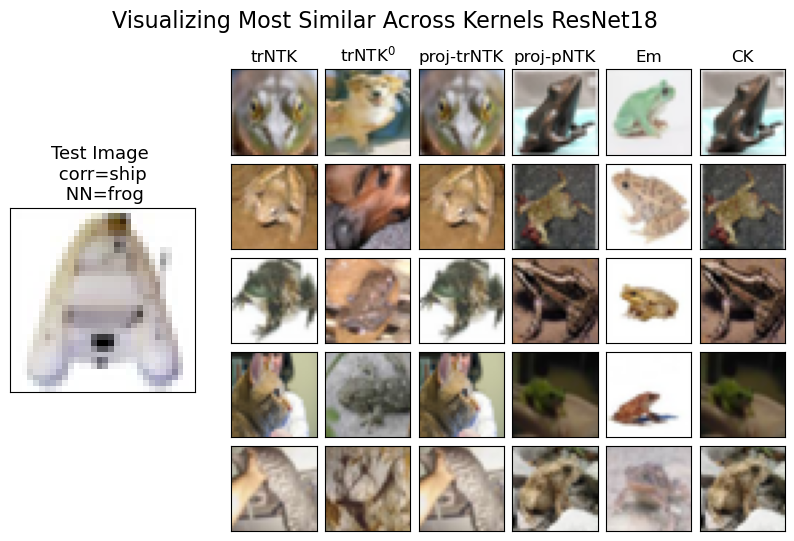

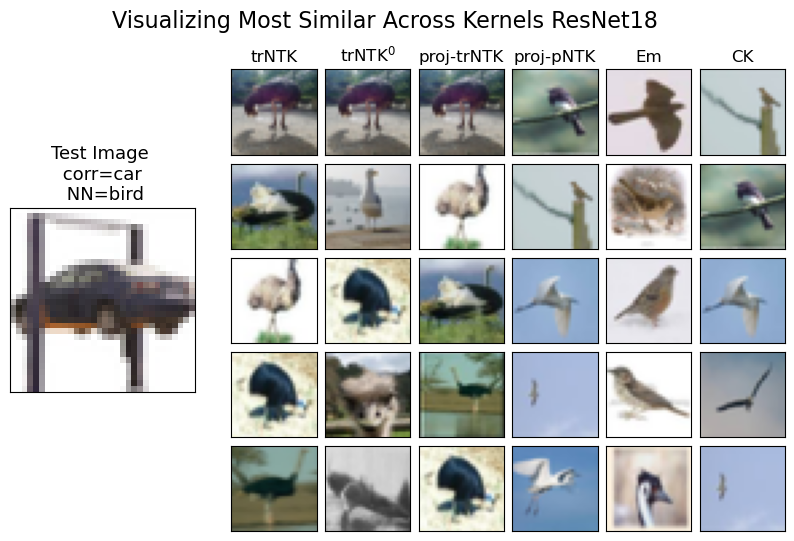

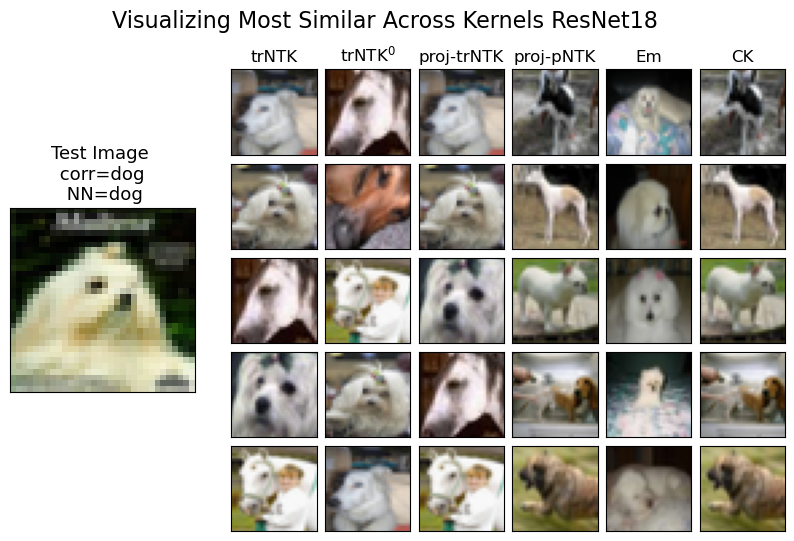

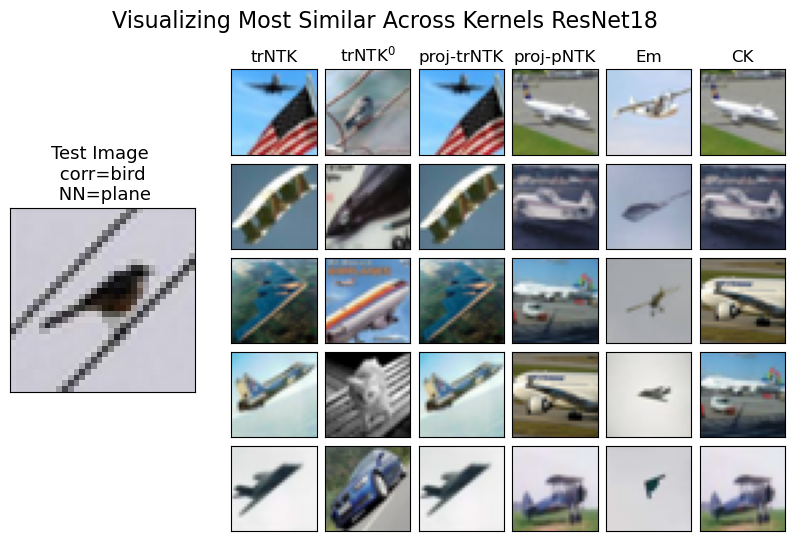

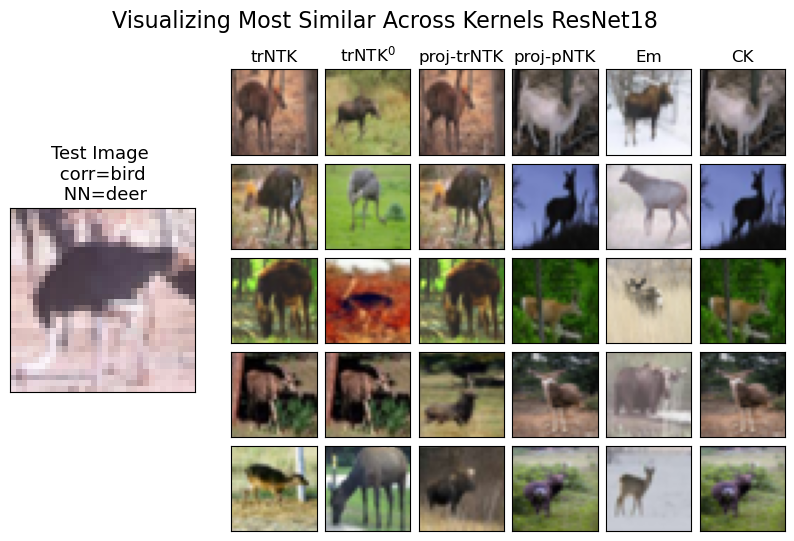

In [115]:
#1999
#20
#4880
#131

CompareAllViz(131)

if True:
    for index in [1999,20,4880,131,242,160,2533,3828,4747,731,2331]:
        CompareAllViz(index)

# Global analysis: are predictions better described by a few most attributable examples, or by the means?

We know that the logit = N \times \mu

# Most similar examples seem ''conceptually'' more appealing than representer points.

# can we make a model that recovers the same performance using something that builds from this intuition instead?

--Appendix/to do item. Share these images in the Appendix now and leave ot future work

In [116]:
def KNN_evaluate_one(test_index,name,K=100,):

    name_kernel_dict = {'trNTK':K1,
                        'trNTK0':K1_0,
                        'proj-trNTK':K1_proj,
                        'proj-pNTK':K1_projpNTK,
                        'Em':K1_Em,
                        'CK':K1_CK,
                       }
    Kernel = name_kernel_dict[name]

    attribution_indices1 = np.argsort(Kernel[test_index,0:50_000])[-K::][::-1]
    values, counts = np.unique(train_y_plot[attribution_indices1],return_counts=True)
    counts = counts/np.sum(counts)
    probability_array = np.zeros(10,dtype=np.float32)
    probability_array[values] = counts
    return probability_array

    
def KNN_evaluate_all(name,K=500,):

    name_kernel_dict = {'trNTK':K1,
                        'trNTK0':K1_0,
                        'proj-trNTK':K1_proj,
                        'proj-pNTK':K1_projpNTK,
                        'Em':K1_Em,
                        'CK':K1_CK,
                       }
    Kernel = name_kernel_dict[name]
    probability_vector= []
    for test_index in tqdm(range(10_000)):
        attribution_indices1 = np.argsort(Kernel[test_index,0:50_000])[-K::][::-1]
        values, counts = np.unique(train_y_plot[attribution_indices1],return_counts=True)
        counts = counts/np.sum(counts)
        probability_array = np.zeros(10,dtype=np.float32)
        probability_array[values] = counts
        probability_vector.append(probability_array)
    probability_vector = np.array(probability_vector)
    return probability_vector

In [117]:
def tau_knn(KNN,NN_logits=NN_logits,test_y_plot=test_y_plot):
    #get correct logit:
    X = []
    Y = []
    for i in tqdm(range(len(KNN))):
        X.append(KNN[i,test_y_plot[i]])
        Y.append(NN_out[i,test_y_plot[i]])
    
    plt.plot(X,Y,'.',alpha=0.1)
    plt.xlabel('KNN Probability (Voting)')
    plt.ylabel('NN Probability')
    Tau = kendalltau(X,Y).correlation
    return Tau



# KNN trNTK

In [119]:
0.9297 - (NN_predictions ==validation_labels).sum() / len(NN_predictions) 

-0.0015000000000000568

100%|████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:40<00:00, 245.19it/s]


Same prediction as NN:  0.9675
KNN test accuracy:  0.9297


100%|████████████████████████████████████████████████████████████████████████| 10000/10000 [00:00<00:00, 1398381.01it/s]


0.5817


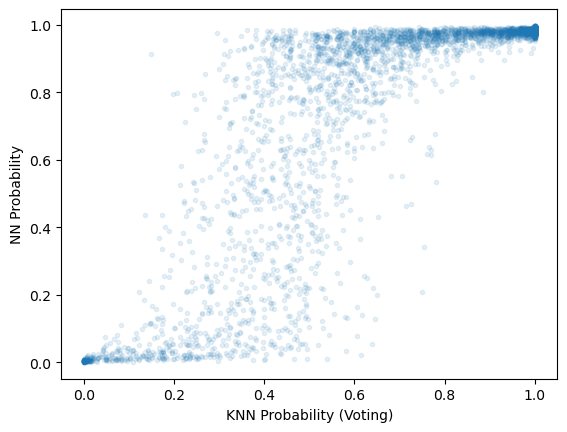

In [147]:
KNN = KNN_evaluate_all('trNTK')

print('Same prediction as NN: ',(np.argmax(KNN_trNTK,axis=1) == NN_predictions).sum()/10_000)
print('KNN test accuracy: ',(np.argmax(KNN_trNTK,axis=1) == test_y_plot).sum()/10_000)

print('{:.4f}'.format(tau_knn(KNN)))


# KNN trNTK0

100%|████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:40<00:00, 244.93it/s]


Same prediction as NN:  0.9675
KNN test accuracy:  0.9297


100%|████████████████████████████████████████████████████████████████████████| 10000/10000 [00:00<00:00, 1386134.37it/s]


0.3928


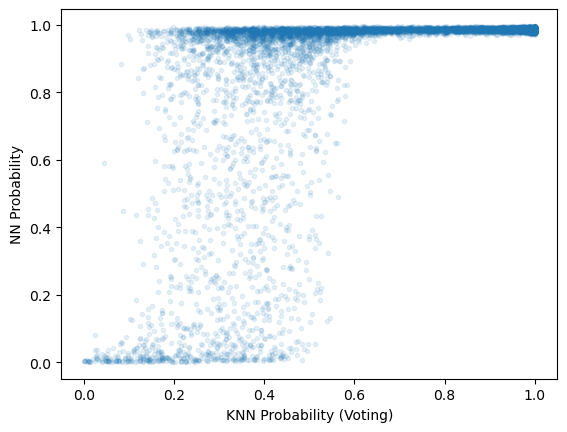

In [148]:
KNN = KNN_evaluate_all('trNTK0')

print('Same prediction as NN: ',(np.argmax(KNN_trNTK,axis=1) == NN_predictions).sum()/10_000)
print('KNN test accuracy: ',(np.argmax(KNN_trNTK,axis=1) == test_y_plot).sum()/10_000)

print('{:.4f}'.format(tau_knn(KNN)))


# KNN CK

100%|████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:41<00:00, 242.77it/s]


Same prediction as NN:  0.9961
KNN test accuracy:  0.9305


100%|████████████████████████████████████████████████████████████████████████| 10000/10000 [00:00<00:00, 1364622.59it/s]


0.5016


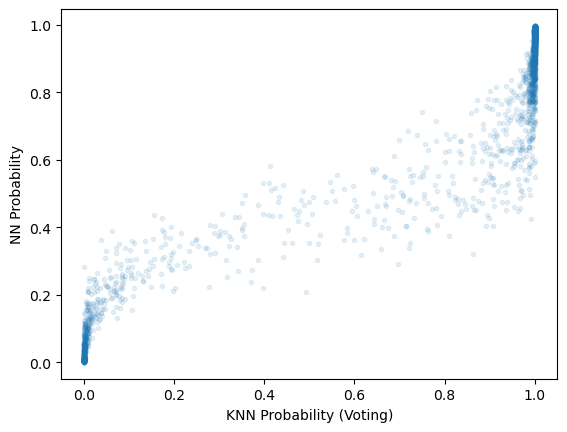

In [149]:
KNN = KNN_evaluate_all('CK')

print('Same prediction as NN: ',(np.argmax(KNN,axis=1) == NN_predictions).sum()/10_000)
print('KNN test accuracy: ',(np.argmax(KNN,axis=1) == test_y_plot).sum()/10_000)

print('{:.4f}'.format(tau_knn(KNN)))


# KNN proj-trNTK

100%|████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:40<00:00, 245.24it/s]


Same prediction as NN:  0.9641
KNN test accuracy:  0.9278


100%|████████████████████████████████████████████████████████████████████████| 10000/10000 [00:00<00:00, 1392669.92it/s]


0.5821


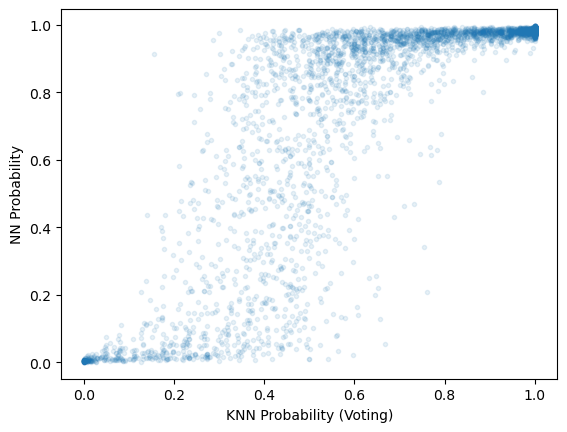

In [150]:
KNN = KNN_evaluate_all('proj-trNTK')

print('Same prediction as NN: ',(np.argmax(KNN,axis=1) == NN_predictions).sum()/10_000)
print('KNN test accuracy: ',(np.argmax(KNN,axis=1) == test_y_plot).sum()/10_000)

print('{:.4f}'.format(tau_knn(KNN)))


# KNN proj-pNTK

100%|████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:40<00:00, 244.77it/s]


Same prediction as NN:  0.9962
KNN test accuracy:  0.9304


100%|████████████████████████████████████████████████████████████████████████| 10000/10000 [00:00<00:00, 1371942.95it/s]


0.5032


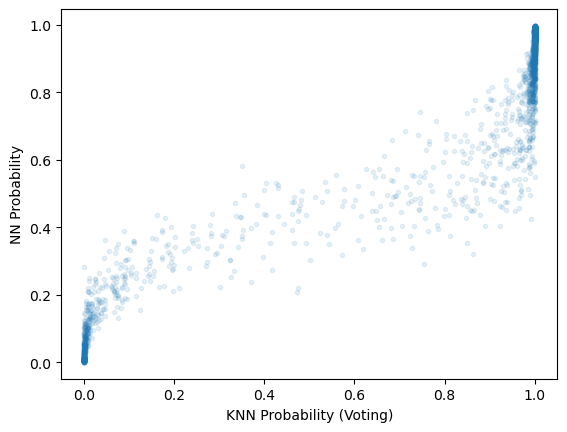

In [151]:
KNN = KNN_evaluate_all('proj-pNTK')

print('Same prediction as NN: ',(np.argmax(KNN,axis=1) == NN_predictions).sum()/10_000)
print('KNN test accuracy: ',(np.argmax(KNN,axis=1) == test_y_plot).sum()/10_000)

print('{:.4f}'.format(tau_knn(KNN)))


# KNN Em

100%|████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:41<00:00, 241.77it/s]


Same prediction as NN:  0.9858
KNN test accuracy:  0.9269


100%|████████████████████████████████████████████████████████████████████████| 10000/10000 [00:00<00:00, 1368049.84it/s]


0.4221


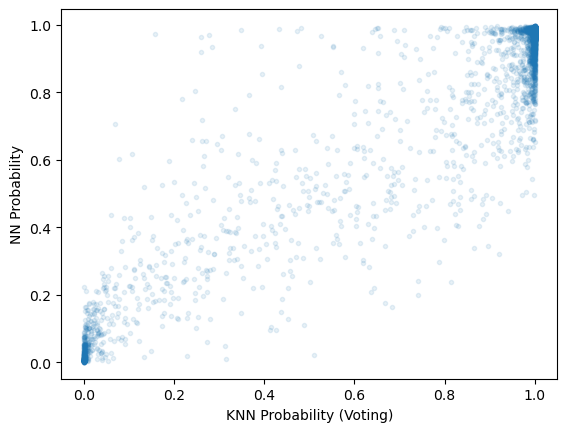

In [152]:
KNN = KNN_evaluate_all('Em')

print('Same prediction as NN: ',(np.argmax(KNN,axis=1) == NN_predictions).sum()/10_000)
print('KNN test accuracy: ',(np.argmax(KNN,axis=1) == test_y_plot).sum()/10_000)

print('{:.4f}'.format(tau_knn(KNN)))


In [ ]:
#trNTK = 0.5856, #K=500 ; test_acc = ; w/NN = 
#trNTK0 = 0.3928
#CK =
#proj-trNTK =
#proj-pNTK =
#EM = 